In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster import hierarchy
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
import plotly.express as pe
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250
plt.show()
import warnings
warnings.filterwarnings('ignore')

In [2]:
pcs = pd.read_csv("D:\ExcelR_Project\Datasets\EDA_PCA.csv")
pcs.head()

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend
0,5.446908,1.596027,2.450277,0.187151,0.692765,-1.998000,-1.180487,-1.640856,0.026894,0.662359,-1.138991,1.675125,-0.019059,0.116210,0.056829,-0.093519,0.748449,0.136444,-0.414580,0.711710
1,-3.026638,-1.078554,-1.368121,-1.689769,-0.107140,0.112623,-0.525647,-0.713752,0.389224,-0.390967,-0.456495,0.331870,0.735838,-0.466735,-0.290718,-0.078136,0.413326,-0.353469,0.138078,0.319266
2,2.359628,-0.652188,-0.880698,0.232794,-0.368634,0.616306,-1.052719,0.753371,-1.131450,0.962276,-0.136496,-0.569202,-0.200257,0.328437,-0.053659,-1.339630,-0.175534,-0.051898,1.468856,-0.201896
3,-2.885269,-0.965010,0.881860,0.266688,-0.562896,1.459526,0.391816,-0.103090,-0.526549,0.193703,0.014144,0.383381,0.276430,-0.301208,-0.736248,-0.333813,0.606982,0.016603,-0.149469,-0.012290
4,0.130790,0.326647,-0.646069,0.989476,0.098751,1.114756,1.888227,-1.331204,0.180033,0.980147,0.289413,1.069280,-0.319012,-0.657144,0.758031,0.316216,-0.090599,0.902417,-0.263946,-0.259885


# Clustering Model Building.

In [3]:
# Methods using for creating clustering model.
# 1. Hierarchical Clustering (Single Linkage Method)
# 2. Hierarchical Clustering (Complete Linkage Method)
# 3. Agglomerative Clustering
# 4. K-Means Clustering
# 5. DBSCAN 

# 1. Hierarchical Clustering using 'Single' linkage.

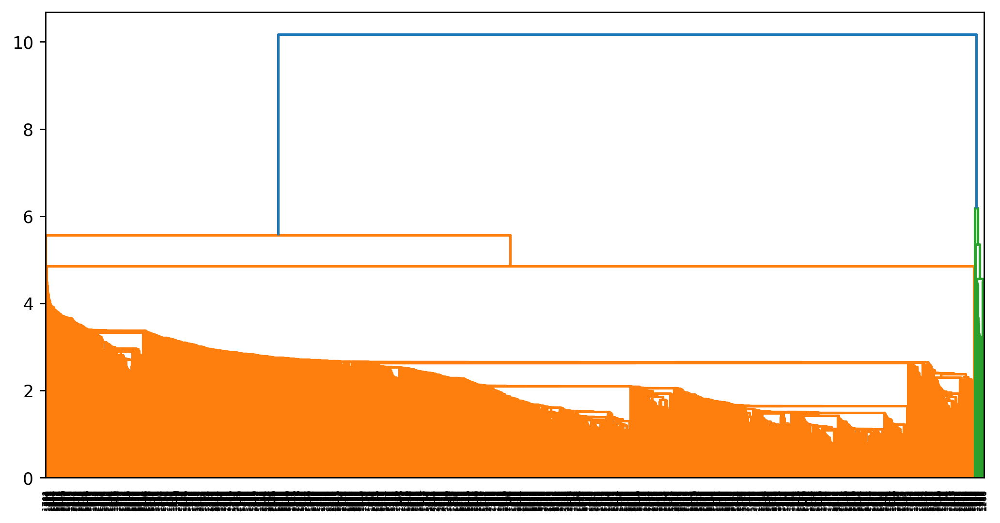

In [4]:
# 1. Hierarchical Clustering using 'Single' linkage.
# Deciding How many clusters to be made..
single_linkage = hierarchy.linkage(pcs, method = 'single')
dendrogram = hierarchy.dendrogram(single_linkage)

In [5]:
# Due to huge dataset the dendrogram is not interpretable 
# This cannot be a good approch to deal clustering with huge dataset using Hierarchical clustering

# 2. Hierarchical CLustering using 'Complete' linkage.

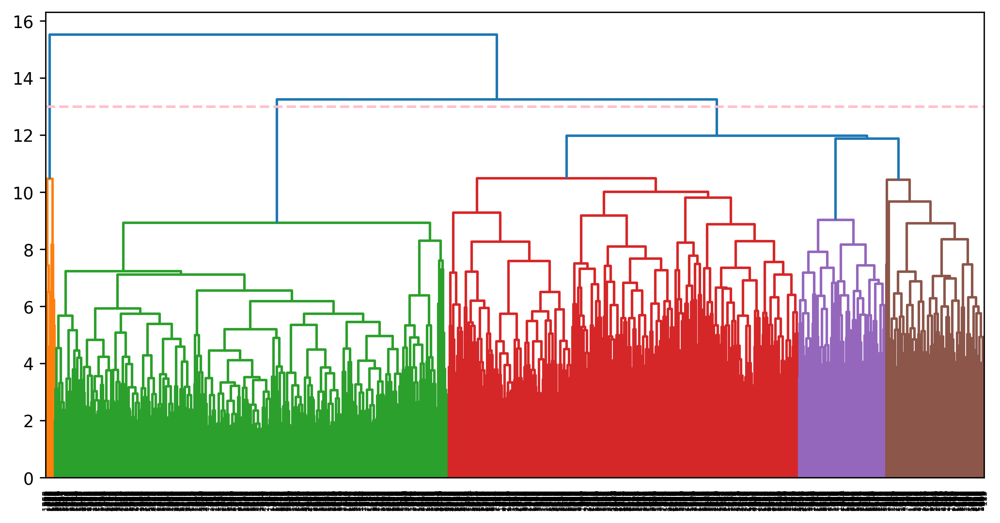

In [6]:
# 2. Hierarchical CLustering using 'Complete' linkage.
complete_linkage = hierarchy.linkage(pcs, method = 'complete')
dendrogram1 = hierarchy.dendrogram(complete_linkage)
plt.axhline(y = 13, linestyle = '--', color = 'pink')

In [7]:
# We can see the clusters are formed 
# We have maked horizontal cutting line to select the number of clusters to be formed. 
# but there is more jumbling of clusters and we can't decide the ideal no. clusters to form.
# So I think this could not be good approcach also Hierarchical Clustering is not good approach for large datasets.

# 3.1 Agglomerative Clustering

In [8]:
# 3.1 Agglomerative Clustering
hc = AgglomerativeClustering(n_clusters = 6) # assuming 6 clusters are sufficient.
hc_predict = hc.fit_predict(pcs)
hc_predict

array([4, 2, 0, ..., 1, 0, 5], dtype=int64)

In [9]:
pcs['Clusters'] = hc_predict
print(pcs['Clusters'].unique())
pcs[pcs['Clusters'] == 0]

[4 2 0 5 1 3]


,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumStorePurchases,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,Clusters
2,2.359628,-0.652188,-0.880698,0.232794,-0.368634,0.616306,-1.052719,0.753371,-1.131450,0.962276,...,-0.569202,-0.200257,0.328437,-0.053659,-1.339630,-0.175534,-0.051898,1.468856,-0.201896,0
5,1.172529,0.791295,-0.197307,-0.584084,-0.507034,0.910970,-0.116775,1.034105,-0.100855,1.099725,...,-0.811548,-0.328412,-0.093301,-0.253974,-0.457435,-0.267114,-0.256889,-1.163249,0.739037,0
6,1.276556,1.499594,-0.033274,1.144309,0.006808,0.298557,-1.228263,-0.181018,0.395650,1.452003,...,-0.307007,-0.536713,0.008257,0.508135,-0.726347,0.607556,-0.366420,-0.513263,-0.013840,0
16,-0.484804,-0.066243,-0.693235,-0.165117,0.180567,-1.311461,-2.910970,0.837166,-1.197819,0.755076,...,1.015643,0.396180,0.599502,-0.898461,-0.585843,0.200021,0.582564,1.481061,-0.363343,0
17,4.441526,1.664184,-1.516956,-0.675617,0.525264,-1.181948,1.013069,-0.125829,-1.427267,-0.807592,...,-1.087136,-0.519812,-2.066491,1.056217,0.205552,0.271714,0.086381,-0.599248,-0.462907,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019,0.306040,-0.102839,-0.287150,1.146829,0.218378,0.508477,1.105737,-0.326004,0.323671,0.841240,...,-0.345400,0.439043,-0.593697,0.045935,0.931407,0.369656,-0.491493,-0.333473,-0.014673,0
2023,0.091814,3.248019,-1.986828,1.695358,-0.214319,0.916861,1.485612,-0.223437,-0.152139,-0.018933,...,0.370504,1.261720,-0.298565,1.015540,0.172464,0.180643,-0.357235,0.569019,-0.718004,0
2027,1.624713,1.800341,-1.004672,0.984417,-0.110460,-0.913740,1.002324,2.797839,-1.102213,0.664261,...,0.078149,-0.450384,0.211050,-0.334598,-0.400915,-0.941300,-0.741884,0.566974,0.681135,0
2030,2.661378,0.753464,-0.120966,0.671445,-0.054614,0.097700,-0.550046,-0.946097,-1.012263,-0.398151,...,-1.332593,0.298256,0.740867,0.522827,0.826219,0.201430,-0.304515,-1.312188,-0.694249,0


In [10]:
pcs[pcs['Clusters'] == 1]

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumStorePurchases,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,Clusters
11,3.172521,-2.586059,-1.071090,0.848177,0.659619,-0.925909,-0.924557,-0.894487,0.583203,1.364634,...,0.445218,-0.419554,0.594672,-0.351139,-0.097068,-0.148302,-0.638809,0.371071,-0.408597,1
20,0.708678,0.596052,0.080447,0.506795,-0.334576,0.907401,0.930528,0.074041,2.208642,-1.499303,...,4.397360,-1.070030,0.656785,0.776315,0.333536,2.331795,0.067230,-1.126894,0.633987,1
27,4.804810,-1.488365,-1.494342,0.215675,0.366995,-0.832750,1.429369,1.003821,1.082845,1.145409,...,0.404220,-0.959896,-0.301199,1.418601,0.199592,-0.263600,-0.855406,-0.892582,0.829470,1
29,-0.329643,-1.703243,-0.474668,0.199860,0.083973,-0.894436,-0.777025,-0.198424,-0.791111,-1.436235,...,0.431340,-0.600612,1.027960,0.196480,-0.695957,-0.893750,0.141986,-0.647852,0.370777,1
32,2.979052,-1.246371,-0.788346,-0.931013,-0.211919,-0.435037,-2.377684,1.131088,-0.127563,1.146123,...,1.166183,0.050872,0.143598,-0.801490,1.362488,-0.257557,0.492932,0.403192,-0.019361,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1990,4.628416,-1.887595,-1.492851,-1.169474,0.030908,-0.185365,0.529718,0.265027,0.049863,0.324437,...,1.473040,-0.442523,-0.554700,1.618756,0.033940,0.266970,0.257808,-0.550855,0.802317,1
1991,3.024200,-1.742958,-1.322634,-0.361104,-0.018077,0.148877,-1.078800,-1.386650,-0.682173,-1.760308,...,1.562913,-1.173179,-0.977759,-0.272573,-0.997251,-0.238216,1.133118,0.725264,-0.784973,1
2013,3.723568,-2.382566,-0.445633,0.760092,-0.504320,1.365582,0.404142,0.269744,-0.140282,0.009255,...,0.085314,0.060821,-1.330599,-0.150438,-1.061823,0.306431,-0.245970,0.916595,-1.156709,1
2015,3.678717,-1.871368,0.545389,2.254326,-0.330900,0.163500,-0.013252,1.812159,1.507351,-0.147184,...,0.471307,0.566621,-0.392823,0.285168,-0.595981,-0.171413,0.092150,-0.213265,-0.176480,1


In [11]:
pcs[pcs['Clusters'] == 2]

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumStorePurchases,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,Clusters
1,-3.026638,-1.078554,-1.368121,-1.689769,-0.107140,0.112623,-0.525647,-0.713752,0.389224,-0.390967,...,0.331870,0.735838,-0.466735,-0.290718,-0.078136,0.413326,-0.353469,0.138078,0.319266,2
12,-1.380338,1.050914,-1.988730,-1.219939,0.017663,-0.414016,-0.214252,0.230428,0.161361,0.143136,...,-0.036882,0.955844,-0.457575,0.380877,-0.347121,-0.358508,0.135127,0.083738,-0.152585,2
15,-2.909982,0.740222,-0.335582,1.634883,-0.101703,-0.228459,-0.542191,0.656067,1.134264,0.078365,...,-0.186436,0.954810,-0.391780,0.596141,0.511765,0.467200,-0.201698,0.266438,-0.030765,2
25,-1.845214,1.307162,-0.803289,0.213411,-0.931797,1.454877,-0.895155,0.354921,0.599581,-0.636488,...,-0.344362,0.116676,0.351630,0.664755,0.242968,0.281771,-0.510024,0.255262,-0.221065,2
26,-1.930000,-1.123430,1.057235,0.827922,-0.454725,1.139866,0.028589,0.246501,0.413309,0.010554,...,0.016273,0.654641,0.204268,0.448849,0.451573,0.771510,0.200516,-0.119526,-0.432525,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021,-3.101581,-0.221480,-1.716874,-1.134466,-0.489330,1.276125,-0.240472,-0.865359,1.414573,-0.078601,...,-0.508781,-0.226099,-0.279766,0.339464,0.496673,-0.496809,0.261047,0.129306,0.116038,2
2022,0.491291,0.732286,-0.397338,-1.399207,-0.786317,1.475636,1.320398,0.604400,-0.413111,-0.316852,...,0.352261,-0.428744,0.704501,0.302253,-0.712704,0.011711,0.397348,-0.529949,0.704785,2
2024,-0.088999,1.599139,-0.664891,-0.310772,-0.244519,0.607862,-0.091215,-0.492873,-0.395906,-1.171005,...,0.000838,-0.597052,0.146730,-0.429697,-0.405953,0.364473,-0.711644,-0.010678,-0.620971,2
2025,-3.313202,-0.604278,-0.499566,-0.380895,-0.785543,1.315150,-0.870654,-0.294866,0.259941,-0.365512,...,0.027989,-0.333874,0.446929,0.037813,0.629870,0.295244,-0.171729,0.526504,0.515905,2


In [12]:
pcs[pcs['Clusters'] == 3]

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumStorePurchases,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,Clusters
72,-2.845820,-1.506670,2.601033,-1.133270,8.769171,3.621950,-1.140896,2.346317,-0.166570,-1.020738,...,0.134493,-0.972824,0.920338,-0.196364,-0.649976,-0.892515,-0.146570,-0.682403,-0.781415,3
135,-3.404508,-0.463644,2.414755,-0.078974,9.152993,3.214507,-0.249825,1.877404,-0.012356,-0.827686,...,-0.083010,0.287197,0.063739,-0.456083,-0.273379,0.147917,-0.185319,-0.198474,-0.106191,3
179,-2.391630,-0.304734,0.256408,-2.641519,10.439357,0.700971,-0.707386,0.490171,-0.789050,-0.618367,...,0.151930,-0.108060,0.090732,0.115242,0.036313,-0.538605,0.283308,-0.367485,-0.192538,3
258,-2.629082,-0.133371,2.041546,-0.847850,8.416172,5.293607,-0.095684,1.493826,-0.156631,-0.697851,...,0.765143,-0.043781,-0.234177,-0.127029,-0.225286,-0.941356,0.050616,-0.476174,-0.522567,3
338,-3.225661,0.412163,1.823189,-0.347918,9.085994,3.749658,-0.286685,1.362156,0.649384,-0.940668,...,-0.354669,0.581808,-0.189630,-0.323242,-0.103767,0.128800,-0.160977,0.066484,0.065212,3
341,1.113757,-0.634477,0.588204,-2.820798,9.705167,1.867218,-0.271596,2.231634,-0.607896,-0.411666,...,0.491664,-0.444413,0.253763,0.572856,0.193157,-0.112821,1.018522,0.545639,-1.184095,3
566,-2.519971,0.887767,4.114943,-0.334713,8.940853,2.479053,-0.485255,1.813308,1.227503,-1.212696,...,0.499052,0.612481,-0.030344,0.471948,-0.326768,-1.732604,-0.280596,0.523065,0.045043,3
928,-2.843616,1.305248,2.792532,0.879656,8.637901,3.994809,-1.566728,2.650541,0.064442,-0.840527,...,0.361523,-0.165395,0.045289,0.348749,0.633872,-0.586168,0.431235,-0.235365,-0.310638,3
991,-3.114001,1.605749,0.542675,-0.916823,10.146409,1.332556,-0.699094,1.104991,0.680015,-0.442947,...,-0.176393,0.181344,-0.107270,0.237873,0.790492,0.457367,-0.034732,0.226273,-0.333365,3
1018,2.399187,-1.303714,0.935089,-0.654479,9.334790,4.054306,2.211257,1.931721,-0.102457,-0.713262,...,0.563496,-0.844357,-0.615851,0.345160,0.542136,0.284634,-0.854127,0.508296,0.878185,3


In [13]:
pcs[pcs['Clusters'] == 4]

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumStorePurchases,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,Clusters
0,5.446908,1.596027,2.450277,0.187151,0.692765,-1.998000,-1.180487,-1.640856,0.026894,0.662359,...,1.675125,-0.019059,0.116210,0.056829,-0.093519,0.748449,0.136444,-0.414580,0.711710,4
14,4.486447,1.318429,1.832350,-2.518817,0.059356,-1.344629,-0.291597,0.926094,-0.310992,1.025688,...,-0.491118,1.132594,0.255191,-0.504738,0.304916,-0.807861,0.064881,-0.215486,0.434940,4
37,2.991332,1.114850,1.756058,-2.158675,0.461334,-1.710307,-0.231386,-1.052858,-0.858342,0.906922,...,2.019322,0.444655,1.606359,-0.127190,0.156107,-0.185366,1.263524,0.320379,1.308664,4
49,5.466061,-1.586718,2.737046,-0.319609,-0.030544,0.425084,0.760216,-2.383328,0.094737,-1.231047,...,0.518762,-0.365395,-0.473138,0.017790,-0.313002,0.579364,0.459152,0.605579,0.411321,4
51,6.979100,0.035813,1.860305,-1.045232,0.522379,-1.740119,-0.485532,-0.628208,0.564454,-0.674257,...,-0.080734,0.353803,0.232790,-1.427853,0.496426,-0.533439,0.800077,-0.281514,0.560250,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1972,2.141961,-1.310623,3.191546,0.244380,0.244825,-0.850021,2.558099,-0.497092,0.534768,-0.469685,...,-0.377399,0.824707,-0.788895,0.696145,-0.605691,-0.570843,-0.682877,0.125066,-0.751085,4
1980,5.717833,-0.416254,3.166214,-0.830709,-0.676341,0.217023,-0.440759,-0.394275,0.503527,-0.889257,...,-0.492836,-0.216507,1.067121,-0.478875,1.209602,-0.676530,0.740401,-0.212439,-1.032188,4
1993,5.499794,-0.618558,2.876619,-0.117090,-0.313993,0.698217,0.933584,0.012078,0.923738,1.786011,...,0.222881,1.079889,-0.078617,-0.497633,-0.135051,-0.650359,0.295198,0.639497,-0.536617,4
1996,5.930917,0.288764,2.264965,-0.884440,0.355576,-1.310611,-0.952503,-0.389579,0.422173,1.124984,...,0.255822,0.657951,0.241899,0.354782,0.726333,-0.131021,0.593328,0.356135,-0.186281,4


In [14]:
pcs[pcs['Clusters'] == 5]

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumStorePurchases,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,Clusters
3,-2.885269,-0.965010,0.881860,0.266688,-0.562896,1.459526,0.391816,-0.103090,-0.526549,0.193703,...,0.383381,0.276430,-0.301208,-0.736248,-0.333813,0.606982,0.016603,-0.149469,-0.012290,5
4,0.130790,0.326647,-0.646069,0.989476,0.098751,1.114756,1.888227,-1.331204,0.180033,0.980147,...,1.069280,-0.319012,-0.657144,0.758031,0.316216,-0.090599,0.902417,-0.263946,-0.259885,5
7,-2.404191,0.225914,1.027682,0.887672,-0.475477,0.641201,0.229281,0.742174,-0.536518,0.171234,...,-0.091256,0.078738,-0.487956,0.540736,0.457095,-0.074041,0.697050,-0.138081,-0.055307,5
8,-2.977728,0.325362,2.533788,-0.865660,-0.558508,-0.483997,-0.342649,0.180123,0.189310,0.410334,...,-0.007074,-0.037453,0.317170,-0.061276,-0.519066,-1.251423,-0.356104,0.411936,0.404120,5
9,-4.633321,-0.137970,-1.046309,-0.829363,0.314585,-1.468084,-0.520898,-0.555370,-0.863632,0.197993,...,0.615162,0.012497,-0.653940,-1.296169,0.581710,-0.544211,0.444230,-0.295447,1.233117,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016,-4.407083,-0.312188,1.785788,0.552125,-0.361758,-0.416166,-1.251695,0.770552,-0.922987,0.452132,...,-0.356636,-0.927181,0.446280,-0.490526,1.093217,0.807261,-0.140975,-0.121894,0.847206,5
2020,-2.852054,0.676247,1.017082,0.701543,-0.597323,1.022271,-0.814677,0.203349,-0.307987,-0.093411,...,1.351318,-0.119393,-0.114364,-0.267238,-0.447402,0.149542,0.663314,-1.133459,0.201683,5
2026,-3.165988,0.459056,0.788102,1.805328,0.241776,-0.371395,0.846659,-0.405416,-0.643199,0.030674,...,0.872691,0.041796,-0.245541,-0.498519,-0.072032,0.601868,-0.027829,-0.083347,0.335625,5
2028,-2.898663,-1.922010,0.886455,1.741798,-0.041505,-0.803103,-0.438739,1.428810,0.176568,-0.386147,...,0.479373,0.388028,-0.182317,0.055392,-0.479760,0.038869,-0.682842,0.200168,-0.295272,5


In [15]:
# Analyzing on which parameter the clusters are made using mean of clusters.
# pcs.groupby('Clusters').agg('mean')

<Axes: ylabel='Clusters'>

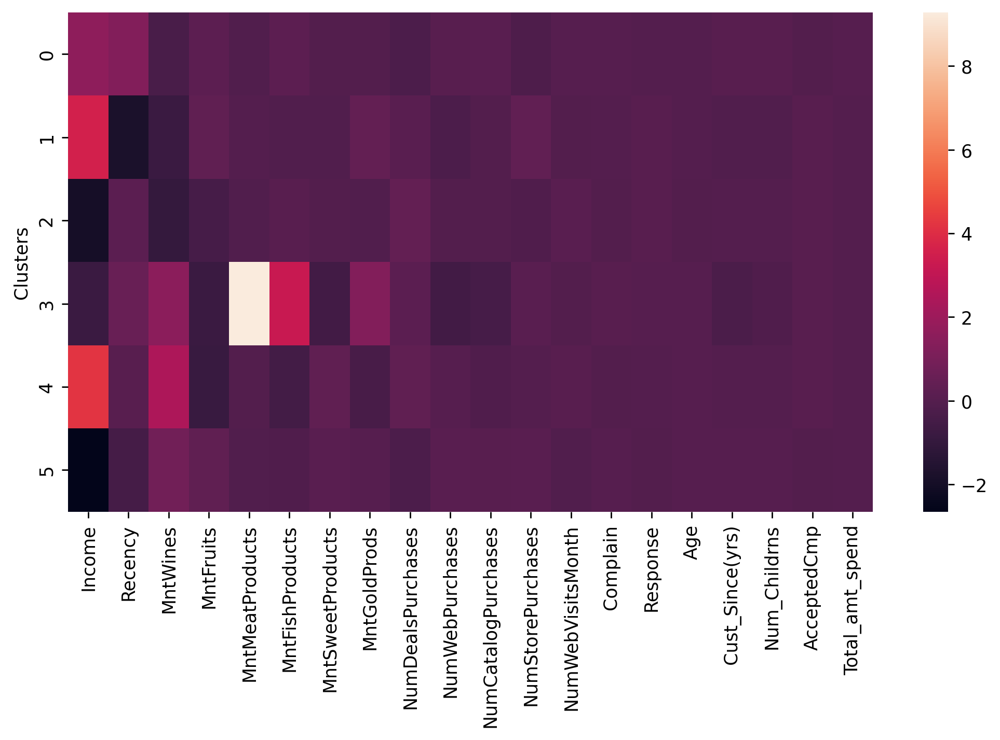

In [16]:
sns.heatmap(pcs.groupby('Clusters').agg('mean'))

In [17]:
pcs.columns

Index(['Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
       'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'Complain', 'Response', 'Age',
       'Cust_Since(yrs)', 'Num_Childrns', 'AcceptedCmp', 'Total_amt_spend',
       'Clusters'],
      dtype='object')

Text(0.5, 1.0, 'Visualizing clusters of Income & Recency using scatterplot')

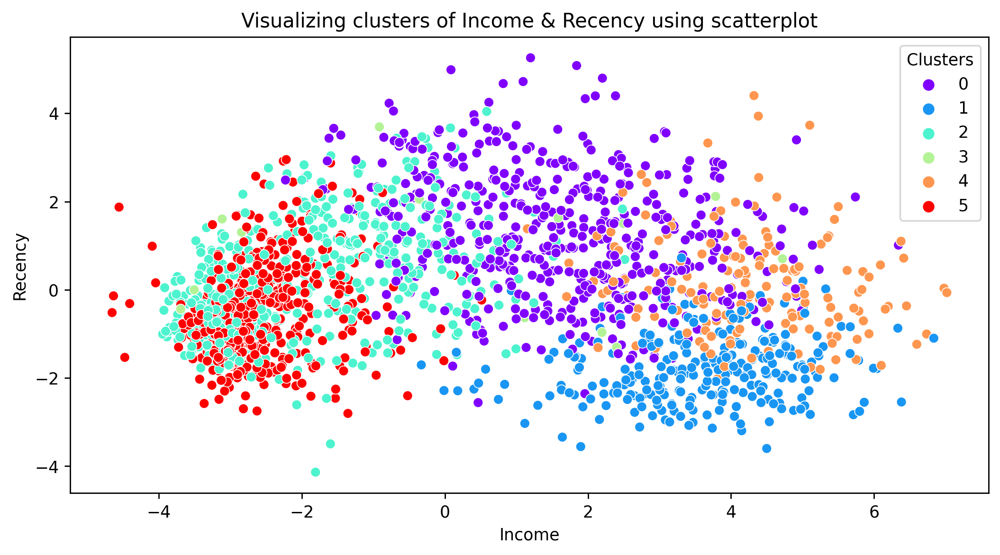

In [18]:
sns.scatterplot(x = pcs['Income'], y = pcs['Recency'], hue = pcs['Clusters'], palette = 'rainbow')
plt.title('Visualizing clusters of Income & Recency using scatterplot')

Text(0.5, 1.0, 'Visualizing clusters of Total_Purchase & Total_amt_spend using scatterplot')

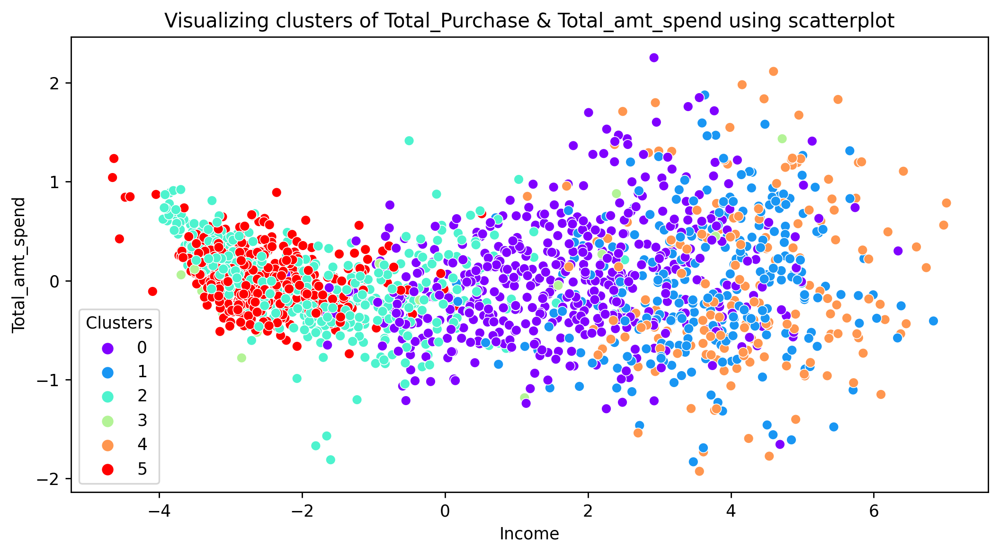

In [19]:
sns.scatterplot(x = pcs['Income'], y = pcs['Total_amt_spend'], hue = pcs['Clusters'], palette = 'rainbow')
plt.title('Visualizing clusters of Total_Purchase & Total_amt_spend using scatterplot')

In [20]:
# There is overlapping of clusters created and looks like 6 is not ideal no. of clusters to make.
# We need to try to make 3 or 4 clusters
# Dropping "Clusters" column and creating new one.
pcs.drop(columns = 'Clusters', inplace = True)

# 3.2 Agglomerative CLustering (n_Clusters = 4)

Text(0.5, 1.0, 'Visualizing clusters of Total_Purchase & Total_amt_spend using scatterplot')

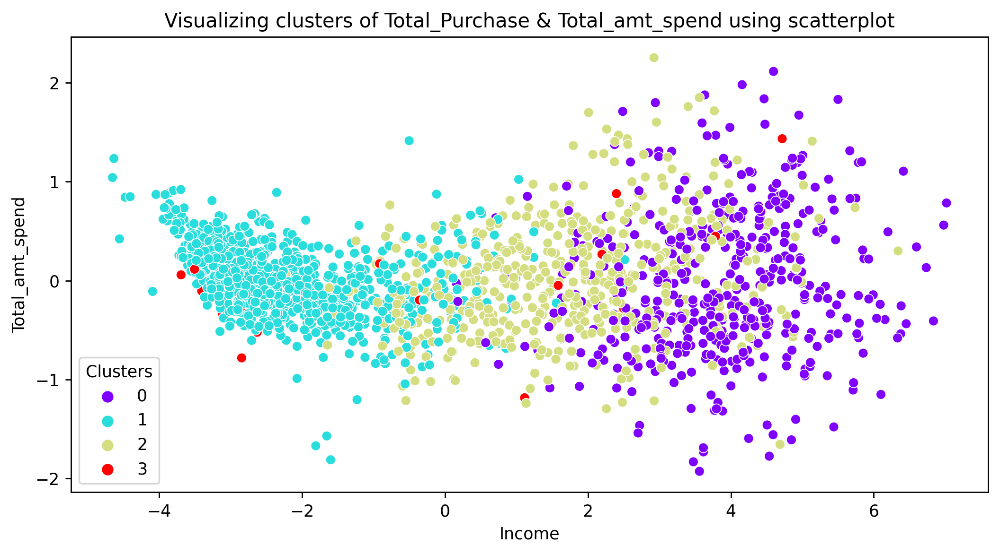

In [21]:
# 3.2 Agglomerative CLustering (n_Clusters = 4)

hc = AgglomerativeClustering(n_clusters = 4) # assuming 4 clusters are sufficient.
hc_predict = hc.fit_predict(pcs)
pcs['Clusters'] = hc_predict
# pcs.groupby('Clusters').agg('mean')
sns.scatterplot(x = pcs['Income'], y = pcs['Total_amt_spend'], hue = pcs['Clusters'], palette = 'rainbow')
plt.title('Visualizing clusters of Total_Purchase & Total_amt_spend using scatterplot')

Text(0.5, 1.0, 'Visualizing clusters of Income & Recency using scatterplot')

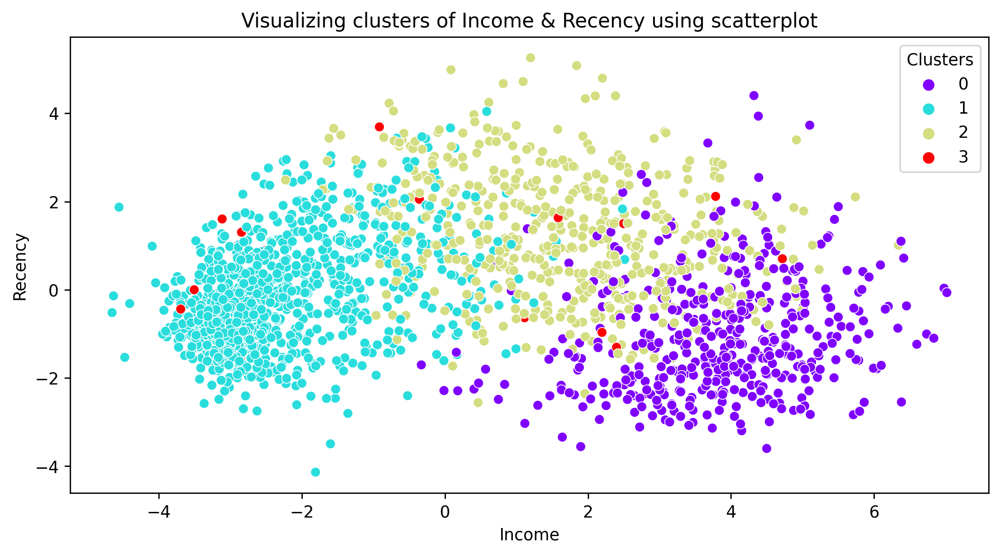

In [22]:
sns.scatterplot(x = pcs['Income'], y = pcs['Recency'], hue = pcs['Clusters'], palette = 'rainbow')
plt.title('Visualizing clusters of Income & Recency using scatterplot')

In [23]:
pe.scatter_3d(x = pcs['Recency'], y = pcs['Total_amt_spend'], z = pcs['Income'], color = pcs['Clusters'])

# 3.3 Agglomerative CLustering (n_Clusters = 3)

Text(0.5, 1.0, 'Visualizing clusters of Total_Purchase & Total_amt_spend using scatterplot')

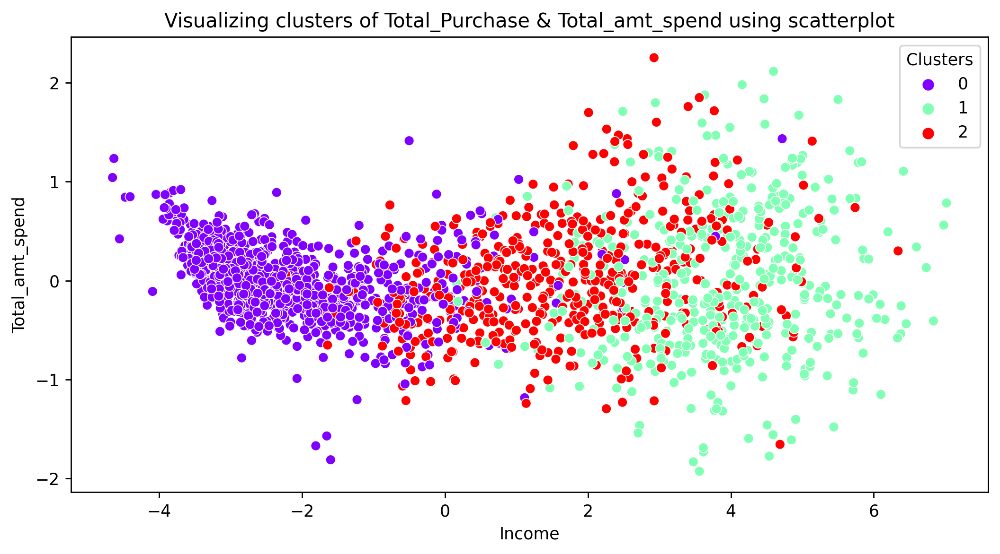

In [24]:
# 3.3 Agglomerative CLustering (n_Clusters = 3)
pcs.drop(columns = 'Clusters', inplace = True)

hc = AgglomerativeClustering(n_clusters = 3) # assuming 3 clusters are sufficient.
hc_predict = hc.fit_predict(pcs)
pcs['Clusters'] = hc_predict
sns.scatterplot(x = pcs['Income'], y = pcs['Total_amt_spend'], hue = pcs['Clusters'], palette = 'rainbow')
plt.title('Visualizing clusters of Total_Purchase & Total_amt_spend using scatterplot')

Text(0.5, 1.0, 'Visualizing clusters of Income & Recency using scatterplot')

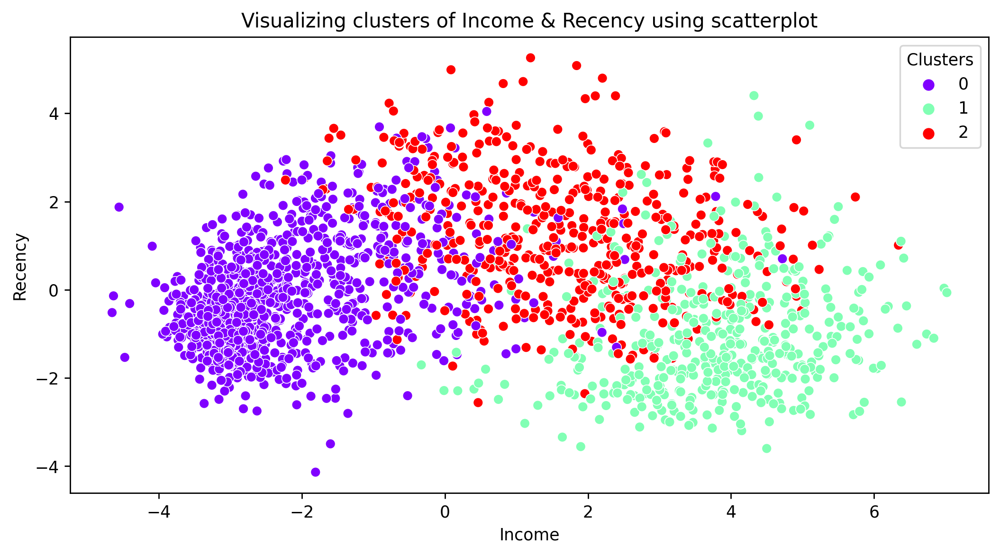

In [25]:
sns.scatterplot(x = pcs['Income'], y = pcs['Recency'], hue = pcs['Clusters'], palette = 'rainbow')
plt.title('Visualizing clusters of Income & Recency using scatterplot')

In [26]:
# 3D Scatterplot of Total Purchases, Total_amt_spend & Income w.r.t. clusters'
pe.scatter_3d(x = pcs['Recency'], y = pcs['Total_amt_spend'], z = pcs['Income'], color = pcs['Clusters'])

In [28]:
# 3D scatterplot between Income, Recency & Total Purchases w.r.t. clusters
pe.scatter_3d(x = pcs['Income'], y = pcs['Recency'], z = pcs['Total_amt_spend'], color = pcs['Clusters'])

Text(0.5, 1.0, 'Visualizing clusters of Income & Num_Childrens using scatterplot')

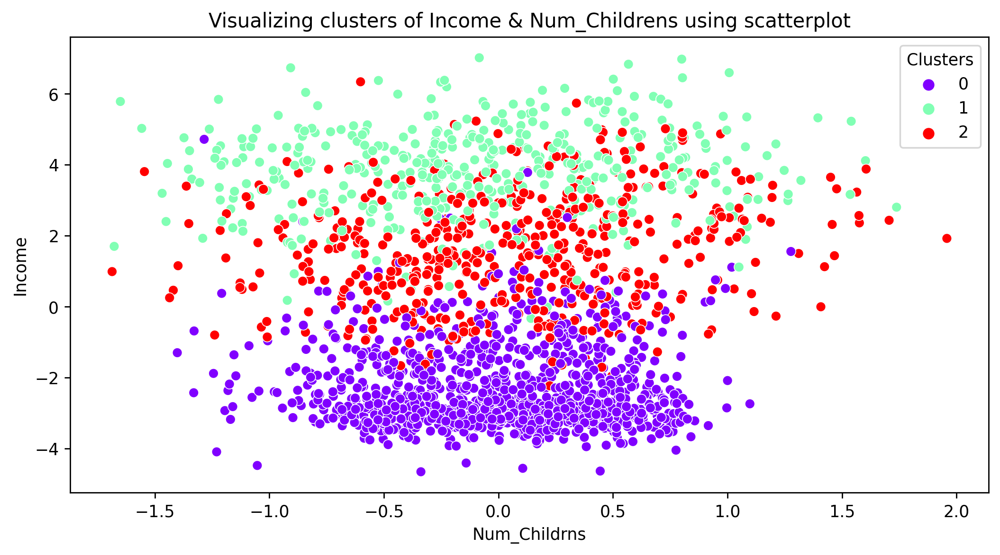

In [29]:
sns.scatterplot(x = pcs['Num_Childrns'], y = pcs['Income'], hue = pcs['Clusters'], palette = 'rainbow')
plt.title('Visualizing clusters of Income & Num_Childrens using scatterplot')

In [30]:
pcs.groupby('Clusters').agg('mean')

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend
Clusters,,,,,,,,,,,,,,,,,,,,
0,-2.311342,-0.150588,-0.002293,-0.052936,0.070395,0.017256,0.015010,-0.016777,0.041721,0.019111,-0.013377,-0.009959,-0.001494,-0.006466,0.000764,-0.000337,-0.002320,0.002667,0.001601,0.003052
1,3.818452,-1.069153,0.401598,-0.125215,-0.053183,-0.264099,0.039228,0.098609,0.203966,-0.127486,-0.098953,0.233262,-0.012536,-0.025773,0.030617,0.005473,-0.067041,-0.080696,0.063161,-0.029695
2,1.615567,1.278507,-0.352534,0.226321,-0.105390,0.197666,-0.067489,-0.051384,-0.272094,0.072026,0.117115,-0.186047,0.014402,0.036972,-0.028914,-0.004140,0.064716,0.066050,-0.059700,0.019813


-The clusters appear to be primarily differentiated based on the following parameters:


Income, Recency, MntWines, MntMeatProducts, MntFishProducts, MntSweetProducts, MntGoldProds, Age, AcceptedCmp


-These parameters show significant mean differences across clusters, indicating their importance in the formation of the clusters.

In [31]:
# Here it looks like 3 clusters are okay to have
# So we have clustered our customers using Agglomerative CLustering Algorithm, and found ideal no. of clusters to make is 3.

# 4. K-Means Clustering.

In [32]:
# 4. K-Means CLustering.
pcs.drop(columns = 'Clusters')

km = KMeans()
km_pred = km.fit_predict(pcs)
# by default it will create 8 clusters.

In [33]:
# checking the centroids of clusters (x, y variable values.)
km.cluster_centers_

array([[ 4.24091380e+00,  1.97216476e-02,  2.60385460e+00,
        -8.42128638e-01, -1.04379269e-01, -4.87869476e-01,
         3.33111816e-01, -4.16671358e-01,  2.99350269e-01,
         2.86206516e-02, -1.20264020e-01, -2.05671255e-02,
         6.19079348e-02, -5.17430238e-02,  5.94880176e-03,
         4.44914376e-02, -2.13889607e-02, -4.93884271e-02,
         8.67978668e-02, -1.41993066e-02,  1.00000000e+00],
       [-2.75417289e+00, -4.44255145e-01,  9.34688722e-01,
         3.62327666e-01, -1.16799731e-01, -1.32050800e-01,
         3.38061612e-02,  7.30762824e-02, -2.37341363e-01,
         1.20517218e-01,  5.75518689e-02,  1.16752503e-01,
        -1.10813387e-01,  1.17577803e-02, -8.52123006e-02,
         4.98549768e-02,  6.42850795e-02,  2.73280855e-02,
        -6.74537227e-02,  7.37213625e-03,  1.12994350e-02],
       [ 2.75481076e+00,  6.05143122e-01, -6.36955054e-01,
         5.73914912e-01,  1.13270340e-03,  4.09699188e-01,
        -3.02092386e-01, -3.40626515e-01, -1.33243045e

In [34]:
# it has created 8 clusters 

In [35]:
pcs.columns

Index(['Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
       'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'Complain', 'Response', 'Age',
       'Cust_Since(yrs)', 'Num_Childrns', 'AcceptedCmp', 'Total_amt_spend',
       'Clusters'],
      dtype='object')

Text(0.5, 1.0, 'K-Means Clustering of Income & Total_Purchases')

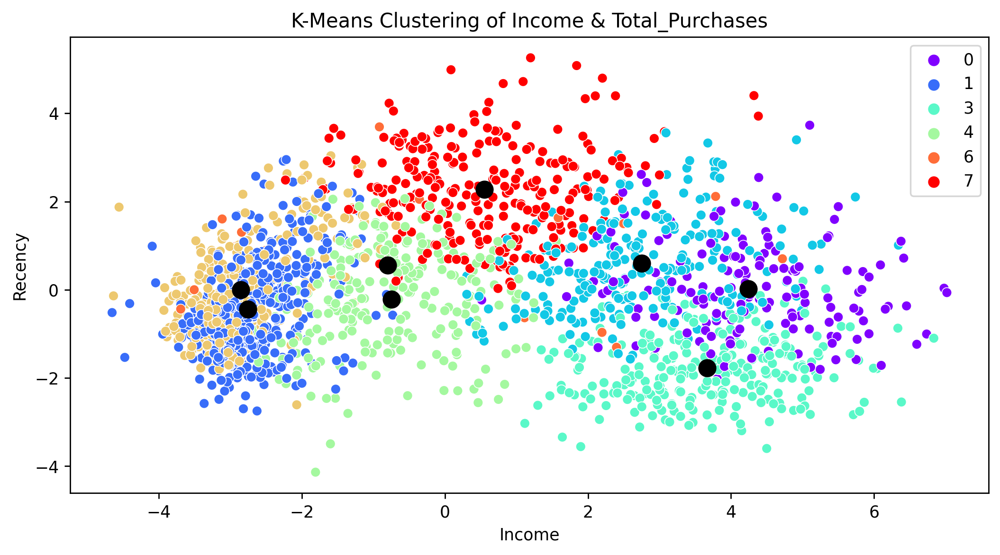

In [36]:
# Visualizing default created clusters.
sns.scatterplot(x = pcs['Income'], y = pcs['Recency'], hue = km_pred, palette = 'rainbow')
plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:,1], c = 'black', s = 100)
plt.title('K-Means Clustering of Income & Total_Purchases')

Text(0.5, 1.0, 'Visualizing clusters of Total_Purchase & Total_amt_spend using scatterplot')

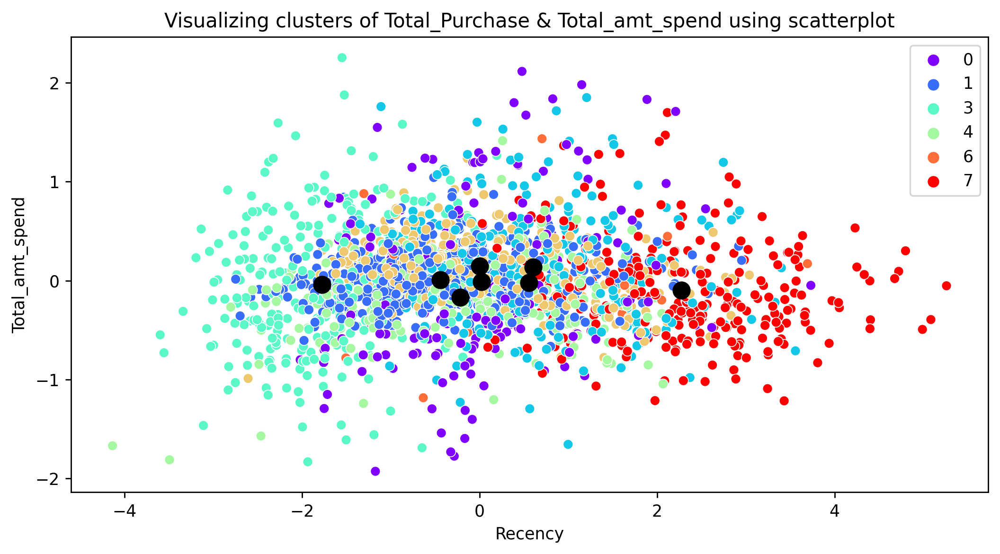

In [37]:
sns.scatterplot(x = pcs['Recency'], y = pcs['Total_amt_spend'], hue = km_pred, palette = 'rainbow')
plt.scatter(km.cluster_centers_[:,1], km.cluster_centers_[:,19], c = 'black', s = 100)
plt.title('Visualizing clusters of Total_Purchase & Total_amt_spend using scatterplot')

In [38]:
# Here we can see there is jumbling of default clusters created

# plotting Elbow Graph to get Ideal number of clusters to be made using K-Means Clustering ALgorithm.

In [39]:
pcs.head()

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumStorePurchases,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,Clusters
0,5.446908,1.596027,2.450277,0.187151,0.692765,-1.998000,-1.180487,-1.640856,0.026894,0.662359,...,1.675125,-0.019059,0.116210,0.056829,-0.093519,0.748449,0.136444,-0.414580,0.711710,1
1,-3.026638,-1.078554,-1.368121,-1.689769,-0.107140,0.112623,-0.525647,-0.713752,0.389224,-0.390967,...,0.331870,0.735838,-0.466735,-0.290718,-0.078136,0.413326,-0.353469,0.138078,0.319266,0
2,2.359628,-0.652188,-0.880698,0.232794,-0.368634,0.616306,-1.052719,0.753371,-1.131450,0.962276,...,-0.569202,-0.200257,0.328437,-0.053659,-1.339630,-0.175534,-0.051898,1.468856,-0.201896,2
3,-2.885269,-0.965010,0.881860,0.266688,-0.562896,1.459526,0.391816,-0.103090,-0.526549,0.193703,...,0.383381,0.276430,-0.301208,-0.736248,-0.333813,0.606982,0.016603,-0.149469,-0.012290,0
4,0.130790,0.326647,-0.646069,0.989476,0.098751,1.114756,1.888227,-1.331204,0.180033,0.980147,...,1.069280,-0.319012,-0.657144,0.758031,0.316216,-0.090599,0.902417,-0.263946,-0.259885,0


In [40]:
# Getting inertia of K-Means Clusters and stroing in wcss.
wcss = []
pcs.drop(columns = 'Clusters')
for i in range(1,11):
    km = KMeans(n_clusters= i)
    km.fit_predict(pcs)
    wcss.append(km.inertia_)

Text(0.5, 1.0, 'Elbow Graph')

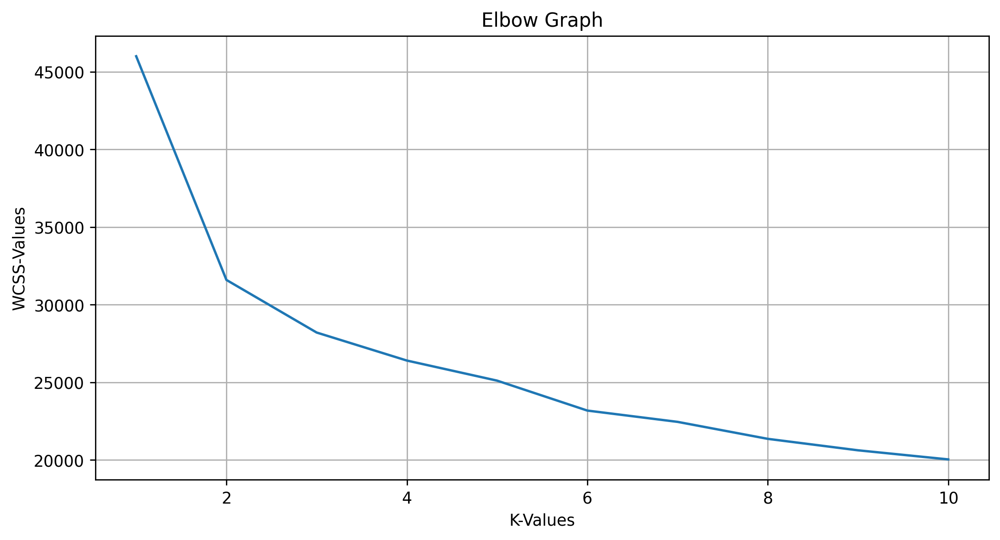

In [41]:
# Plotting Elbow Graph
plt.plot(range(1,11), wcss)
plt.grid()
plt.xlabel('K-Values')
plt.ylabel('WCSS-Values')
plt.title('Elbow Graph')

Text(0.5, 1.0, 'Elbow Graph')

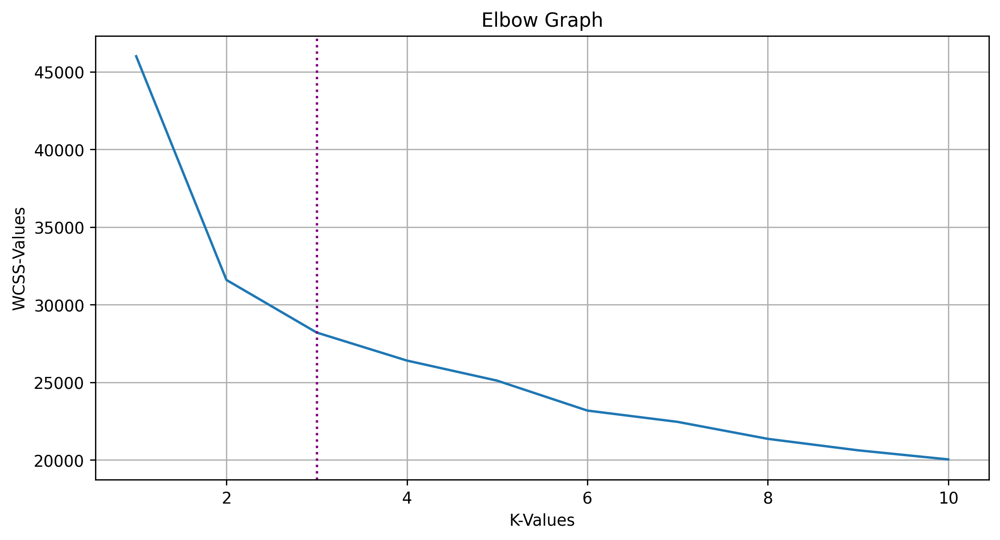

In [42]:
# Plotting Elbow Graph with ideal no. of clusters
plt.plot(range(1,11), wcss)
plt.axvline(3, linestyle = 'dotted', color = 'purple')
plt.grid()
plt.xlabel('K-Values')
plt.ylabel('WCSS-Values')
plt.title('Elbow Graph')

In [43]:
# The graph shows a steep decline in WCSS values from K = 1 to K = 3, and after that, the rate of decrease slows down. 
# This suggests that adding more clusters beyond K = 3 doesn't provide significant improvement in reducing the WCSS.
# Thus, based on the elbow graph, you should create 3 clusters for your K-Means clustering.

In [44]:
# Here we can see after 2 clusters the elbow is created so lots of people can choose 2 as optimal no. od clusters.
# But remember here no. of clusters started from 1 & there is no change in slope of elbow in between 1 & 2 clusters.
# And after 3rd cluster there is no significant dragstic change in slope of elbow.
# SO selecting 3 as Ideal no. of clusters.

# Optimized K-MEANS model.

In [45]:
# Creating a FINAL K-MEANS model for clustering.
pcs.drop(columns = 'Clusters')

km_final = KMeans(n_clusters = 3)
final_Km_pred = km_final.fit_predict(pcs)
pcs['KM_Clusters'] = final_Km_pred
pcs.head()

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,Clusters,KM_Clusters
0,5.446908,1.596027,2.450277,0.187151,0.692765,-1.998000,-1.180487,-1.640856,0.026894,0.662359,...,-0.019059,0.116210,0.056829,-0.093519,0.748449,0.136444,-0.414580,0.711710,1,0
1,-3.026638,-1.078554,-1.368121,-1.689769,-0.107140,0.112623,-0.525647,-0.713752,0.389224,-0.390967,...,0.735838,-0.466735,-0.290718,-0.078136,0.413326,-0.353469,0.138078,0.319266,0,1
2,2.359628,-0.652188,-0.880698,0.232794,-0.368634,0.616306,-1.052719,0.753371,-1.131450,0.962276,...,-0.200257,0.328437,-0.053659,-1.339630,-0.175534,-0.051898,1.468856,-0.201896,2,0
3,-2.885269,-0.965010,0.881860,0.266688,-0.562896,1.459526,0.391816,-0.103090,-0.526549,0.193703,...,0.276430,-0.301208,-0.736248,-0.333813,0.606982,0.016603,-0.149469,-0.012290,0,1
4,0.130790,0.326647,-0.646069,0.989476,0.098751,1.114756,1.888227,-1.331204,0.180033,0.980147,...,-0.319012,-0.657144,0.758031,0.316216,-0.090599,0.902417,-0.263946,-0.259885,0,2


Text(0.5, 1.0, 'Visualizing clusters of Total_Purchase & Total_amt_spend using scatterplot')

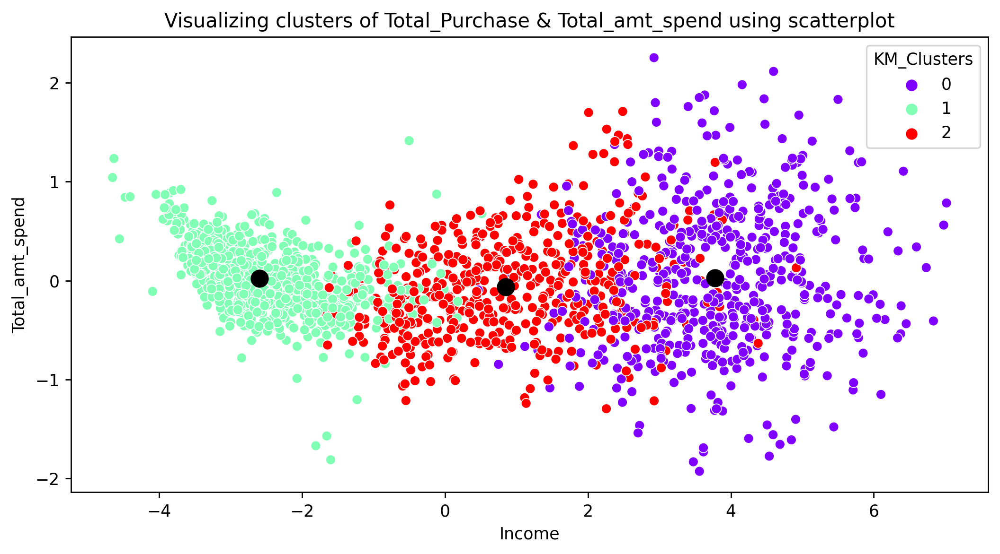

In [46]:
# visualizing the Final K-Means model clusters with their centroids
sns.scatterplot(x = pcs['Income'], y = pcs['Total_amt_spend'], hue = pcs['KM_Clusters'], palette = 'rainbow')
plt.scatter(km_final.cluster_centers_[:,0], km_final.cluster_centers_[:,19], c = 'black', s = 100)
plt.title('Visualizing clusters of Total_Purchase & Total_amt_spend using scatterplot')

In [47]:
# Here we can now see tunning hyperparameters have created best clusters with optimal distrubutions
# So plotting 3d scatterplot to better visualize clusters and understand distribution

In [48]:
pe.scatter_3d(x = pcs['Income'], y = pcs['Total_amt_spend'], z = pcs['Income'], color = pcs['KM_Clusters'])

In [49]:
# after plotting 3d scatterplot we can see that how effectively K-Means alogorithm has created clusters.

Text(0.5, 1.0, 'Visualizing clusters of Total_Purchase & Total_amt_spend using scatterplot')

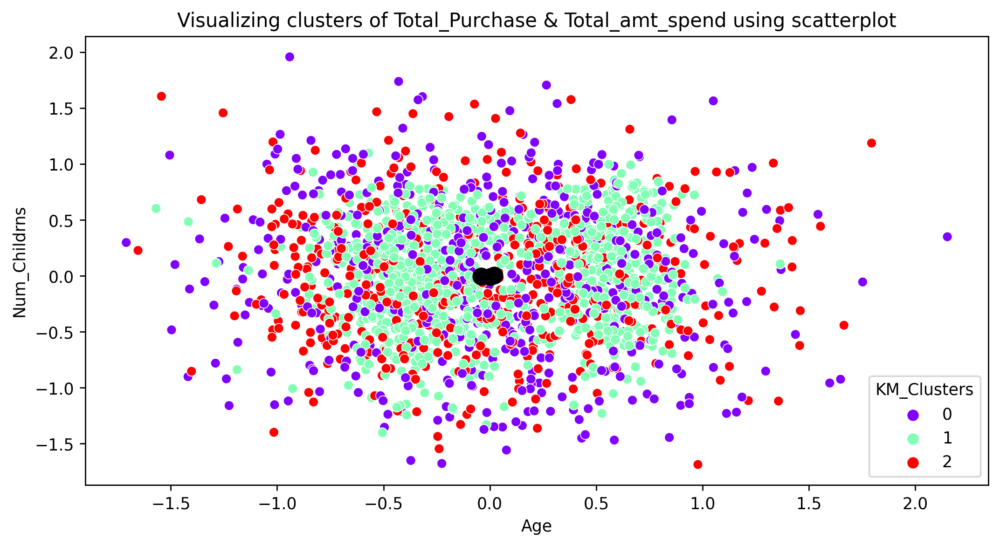

In [50]:
sns.scatterplot(x = pcs['Age'], y = pcs['Num_Childrns'], hue = pcs['KM_Clusters'], palette = 'rainbow')
plt.scatter(km_final.cluster_centers_[:,15], km_final.cluster_centers_[:,17], c = 'black', s = 100)
plt.title('Visualizing clusters of Total_Purchase & Total_amt_spend using scatterplot')

In [51]:
pe.scatter_3d(x = pcs['Age'], y = pcs['Num_Childrns'], z = pcs['Income'], color = pcs['KM_Clusters'])

In [52]:
# Now we can see that clusters are formed precisely.

In [53]:
# printing records by clusters
pcs[pcs['KM_Clusters'] == 0]

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,Clusters,KM_Clusters
0,5.446908,1.596027,2.450277,0.187151,0.692765,-1.998000,-1.180487,-1.640856,0.026894,0.662359,...,-0.019059,0.116210,0.056829,-0.093519,0.748449,0.136444,-0.414580,0.711710,1,0
2,2.359628,-0.652188,-0.880698,0.232794,-0.368634,0.616306,-1.052719,0.753371,-1.131450,0.962276,...,-0.200257,0.328437,-0.053659,-1.339630,-0.175534,-0.051898,1.468856,-0.201896,2,0
11,3.172521,-2.586059,-1.071090,0.848177,0.659619,-0.925909,-0.924557,-0.894487,0.583203,1.364634,...,-0.419554,0.594672,-0.351139,-0.097068,-0.148302,-0.638809,0.371071,-0.408597,1,0
14,4.486447,1.318429,1.832350,-2.518817,0.059356,-1.344629,-0.291597,0.926094,-0.310992,1.025688,...,1.132594,0.255191,-0.504738,0.304916,-0.807861,0.064881,-0.215486,0.434940,1,0
17,4.441526,1.664184,-1.516956,-0.675617,0.525264,-1.181948,1.013069,-0.125829,-1.427267,-0.807592,...,-0.519812,-2.066491,1.056217,0.205552,0.271714,0.086381,-0.599248,-0.462907,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2006,3.209265,-0.748516,-0.489864,1.600091,0.467369,0.584964,0.593096,-1.247436,0.368558,1.155477,...,0.445811,-0.681690,0.526643,0.619836,0.373270,0.110850,-0.348004,0.620297,2,0
2013,3.723568,-2.382566,-0.445633,0.760092,-0.504320,1.365582,0.404142,0.269744,-0.140282,0.009255,...,0.060821,-1.330599,-0.150438,-1.061823,0.306431,-0.245970,0.916595,-1.156709,1,0
2015,3.678717,-1.871368,0.545389,2.254326,-0.330900,0.163500,-0.013252,1.812159,1.507351,-0.147184,...,0.566621,-0.392823,0.285168,-0.595981,-0.171413,0.092150,-0.213265,-0.176480,1,0
2031,1.727531,-1.444823,-0.801508,1.019534,-0.083605,0.292934,2.149227,1.095938,-0.608143,0.218311,...,-0.785133,-1.660371,-1.548529,0.612776,-0.080890,-0.899769,0.815344,0.707024,1,0


In [54]:
pcs[pcs['KM_Clusters'] == 1]

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,Clusters,KM_Clusters
1,-3.026638,-1.078554,-1.368121,-1.689769,-0.107140,0.112623,-0.525647,-0.713752,0.389224,-0.390967,...,0.735838,-0.466735,-0.290718,-0.078136,0.413326,-0.353469,0.138078,0.319266,0,1
3,-2.885269,-0.965010,0.881860,0.266688,-0.562896,1.459526,0.391816,-0.103090,-0.526549,0.193703,...,0.276430,-0.301208,-0.736248,-0.333813,0.606982,0.016603,-0.149469,-0.012290,0,1
7,-2.404191,0.225914,1.027682,0.887672,-0.475477,0.641201,0.229281,0.742174,-0.536518,0.171234,...,0.078738,-0.487956,0.540736,0.457095,-0.074041,0.697050,-0.138081,-0.055307,0,1
8,-2.977728,0.325362,2.533788,-0.865660,-0.558508,-0.483997,-0.342649,0.180123,0.189310,0.410334,...,-0.037453,0.317170,-0.061276,-0.519066,-1.251423,-0.356104,0.411936,0.404120,0,1
9,-4.633321,-0.137970,-1.046309,-0.829363,0.314585,-1.468084,-0.520898,-0.555370,-0.863632,0.197993,...,0.012497,-0.653940,-1.296169,0.581710,-0.544211,0.444230,-0.295447,1.233117,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025,-3.313202,-0.604278,-0.499566,-0.380895,-0.785543,1.315150,-0.870654,-0.294866,0.259941,-0.365512,...,-0.333874,0.446929,0.037813,0.629870,0.295244,-0.171729,0.526504,0.515905,0,1
2026,-3.165988,0.459056,0.788102,1.805328,0.241776,-0.371395,0.846659,-0.405416,-0.643199,0.030674,...,0.041796,-0.245541,-0.498519,-0.072032,0.601868,-0.027829,-0.083347,0.335625,0,1
2028,-2.898663,-1.922010,0.886455,1.741798,-0.041505,-0.803103,-0.438739,1.428810,0.176568,-0.386147,...,0.388028,-0.182317,0.055392,-0.479760,0.038869,-0.682842,0.200168,-0.295272,0,1
2029,-1.231173,0.158876,0.255968,-0.234978,-0.494844,1.122562,0.158046,0.160996,0.788015,-0.178312,...,1.035393,-0.322552,0.717344,-1.286317,1.182753,0.112770,-0.368417,-1.203745,0,1


In [55]:
pcs[pcs['KM_Clusters'] == 2]

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,Clusters,KM_Clusters
4,0.130790,0.326647,-0.646069,0.989476,0.098751,1.114756,1.888227,-1.331204,0.180033,0.980147,...,-0.319012,-0.657144,0.758031,0.316216,-0.090599,0.902417,-0.263946,-0.259885,0,2
5,1.172529,0.791295,-0.197307,-0.584084,-0.507034,0.910970,-0.116775,1.034105,-0.100855,1.099725,...,-0.328412,-0.093301,-0.253974,-0.457435,-0.267114,-0.256889,-1.163249,0.739037,2,2
6,1.276556,1.499594,-0.033274,1.144309,0.006808,0.298557,-1.228263,-0.181018,0.395650,1.452003,...,-0.536713,0.008257,0.508135,-0.726347,0.607556,-0.366420,-0.513263,-0.013840,2,2
16,-0.484804,-0.066243,-0.693235,-0.165117,0.180567,-1.311461,-2.910970,0.837166,-1.197819,0.755076,...,0.396180,0.599502,-0.898461,-0.585843,0.200021,0.582564,1.481061,-0.363343,2,2
20,0.708678,0.596052,0.080447,0.506795,-0.334576,0.907401,0.930528,0.074041,2.208642,-1.499303,...,-1.070030,0.656785,0.776315,0.333536,2.331795,0.067230,-1.126894,0.633987,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022,0.491291,0.732286,-0.397338,-1.399207,-0.786317,1.475636,1.320398,0.604400,-0.413111,-0.316852,...,-0.428744,0.704501,0.302253,-0.712704,0.011711,0.397348,-0.529949,0.704785,0,2
2023,0.091814,3.248019,-1.986828,1.695358,-0.214319,0.916861,1.485612,-0.223437,-0.152139,-0.018933,...,1.261720,-0.298565,1.015540,0.172464,0.180643,-0.357235,0.569019,-0.718004,2,2
2024,-0.088999,1.599139,-0.664891,-0.310772,-0.244519,0.607862,-0.091215,-0.492873,-0.395906,-1.171005,...,-0.597052,0.146730,-0.429697,-0.405953,0.364473,-0.711644,-0.010678,-0.620971,0,2
2027,1.624713,1.800341,-1.004672,0.984417,-0.110460,-0.913740,1.002324,2.797839,-1.102213,0.664261,...,-0.450384,0.211050,-0.334598,-0.400915,-0.941300,-0.741884,0.566974,0.681135,2,2


In [56]:
pcs.groupby('KM_Clusters').agg('mean')

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumStorePurchases,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,Clusters
KM_Clusters,,,,,,,,,,,,,,,,,,,,,
0,3.777926,-0.887693,0.204240,0.036827,0.037048,-0.079385,-0.078814,-0.033974,0.125278,0.010634,...,0.052976,0.003109,-0.005798,0.003003,0.002204,-0.006084,-0.006380,0.036919,0.024172,1.209091
1,-2.599136,-0.340546,0.138588,-0.000846,0.013444,-0.061782,-0.019695,-0.034567,0.047569,0.015701,...,-0.003141,-0.003026,-0.002111,-0.017590,0.020463,0.003376,0.005673,-0.004983,0.019500,0.013430
2,0.849040,1.585039,-0.477684,-0.037667,-0.064710,0.200516,0.120954,0.101060,-0.222771,-0.040790,...,-0.050574,0.002362,0.010140,0.029798,-0.040738,0.000151,-0.003841,-0.030003,-0.062345,1.492248


In [57]:
# Final K-Means model Evaluation
silhouette_score(pcs, final_Km_pred)

0.24742289342311807

# 5. DBSCAN method for clustering

In [58]:
# Rule 1 -> min_samples = at least 3
# Rule 2 -> no. of samples + 1  ----
#                                 ----- Hyperparameter Tuning
# Rule 3 -> no. of samples * 2  ----

In [59]:
# Creating a basic DBSCAN model
db1 = DBSCAN(eps = 0.5, min_samples=3)
x = pcs.drop(columns = 'Clusters')
db1_pred = db1.fit_predict(x)
pcs['db1_clusters'] = db1_pred
pcs['db1_clusters']

0      -1
1      -1
2      -1
3      -1
4      -1
       ..
2029   -1
2030   -1
2031   -1
2032   -1
2033   -1
Name: db1_clusters, Length: 2034, dtype: int64

<Axes: xlabel='Age', ylabel='Num_Childrns'>

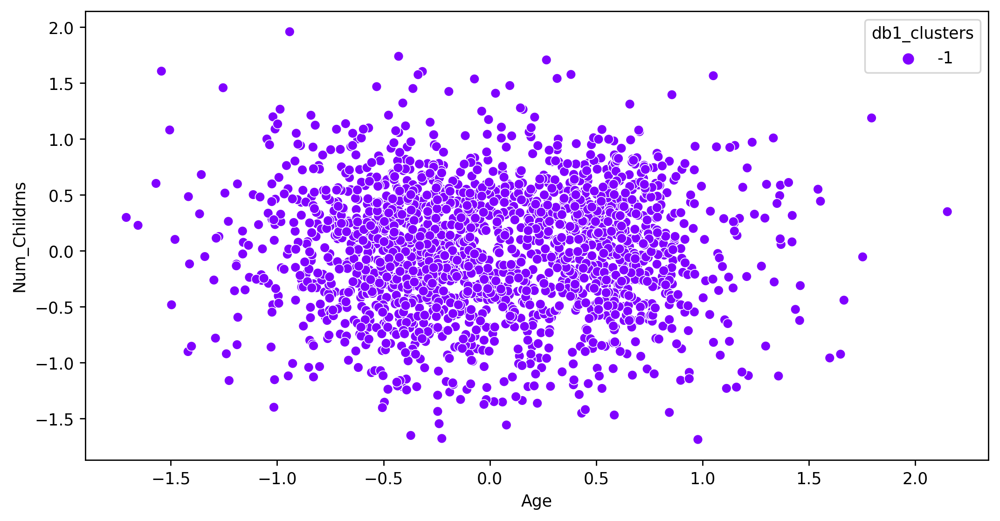

In [60]:
sns.scatterplot(x = pcs['Age'], y = pcs['Num_Childrns'], hue = pcs['db1_clusters'], palette = 'rainbow')

<Axes: xlabel='Income', ylabel='Total_amt_spend'>

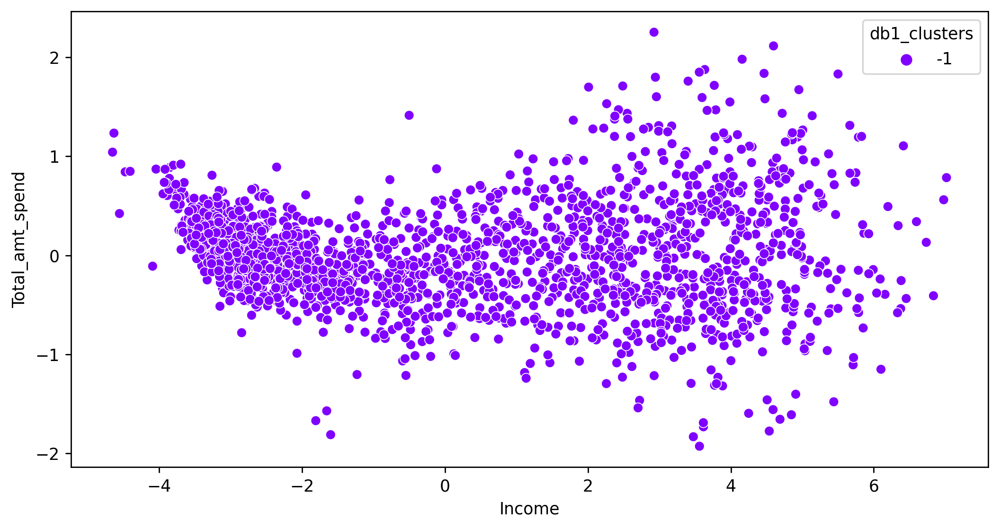

In [61]:
sns.scatterplot(x = pcs['Income'], y = pcs['Total_amt_spend'], hue = pcs['db1_clusters'], palette = 'rainbow')

In [62]:
# DBSCAN basic model has created only 1 cluster for dataset with epsilon value 0.5 and min_samples as 3
# but the -1 cluster represented as noise.
# it means all the datapoints are considered as noisy data according to Basic DBSCAN model.

In [63]:
x.head()

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumStorePurchases,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,KM_Clusters
0,5.446908,1.596027,2.450277,0.187151,0.692765,-1.998000,-1.180487,-1.640856,0.026894,0.662359,...,1.675125,-0.019059,0.116210,0.056829,-0.093519,0.748449,0.136444,-0.414580,0.711710,0
1,-3.026638,-1.078554,-1.368121,-1.689769,-0.107140,0.112623,-0.525647,-0.713752,0.389224,-0.390967,...,0.331870,0.735838,-0.466735,-0.290718,-0.078136,0.413326,-0.353469,0.138078,0.319266,1
2,2.359628,-0.652188,-0.880698,0.232794,-0.368634,0.616306,-1.052719,0.753371,-1.131450,0.962276,...,-0.569202,-0.200257,0.328437,-0.053659,-1.339630,-0.175534,-0.051898,1.468856,-0.201896,0
3,-2.885269,-0.965010,0.881860,0.266688,-0.562896,1.459526,0.391816,-0.103090,-0.526549,0.193703,...,0.383381,0.276430,-0.301208,-0.736248,-0.333813,0.606982,0.016603,-0.149469,-0.012290,1
4,0.130790,0.326647,-0.646069,0.989476,0.098751,1.114756,1.888227,-1.331204,0.180033,0.980147,...,1.069280,-0.319012,-0.657144,0.758031,0.316216,-0.090599,0.902417,-0.263946,-0.259885,2


# DBSCAN Hyperparamater Tunning

In [64]:
# We can see that silhouette score is negative, which shows bad clustering and model performance.
# So to increase model performance we need to fo hyperparameter tunning to get ideal '"eps"' value.

In [65]:
# Rule 2 -> No. of samples + 1

In [66]:
pcs.drop(columns=['db1_clusters','Clusters'], inplace=True)

In [67]:
neigh1 = NearestNeighbors(n_neighbors = 21).fit(x) # (no. of samples + 1) i.e.(25+1)
d1, index1 = neigh1.kneighbors(x)
distance1 = np.sort(d1[:,1])
distance1

array([0.        , 0.        , 0.27950695, ..., 5.45239266, 5.64910702,
       6.18745339])

Text(0, 0.5, 'EPS-Value')

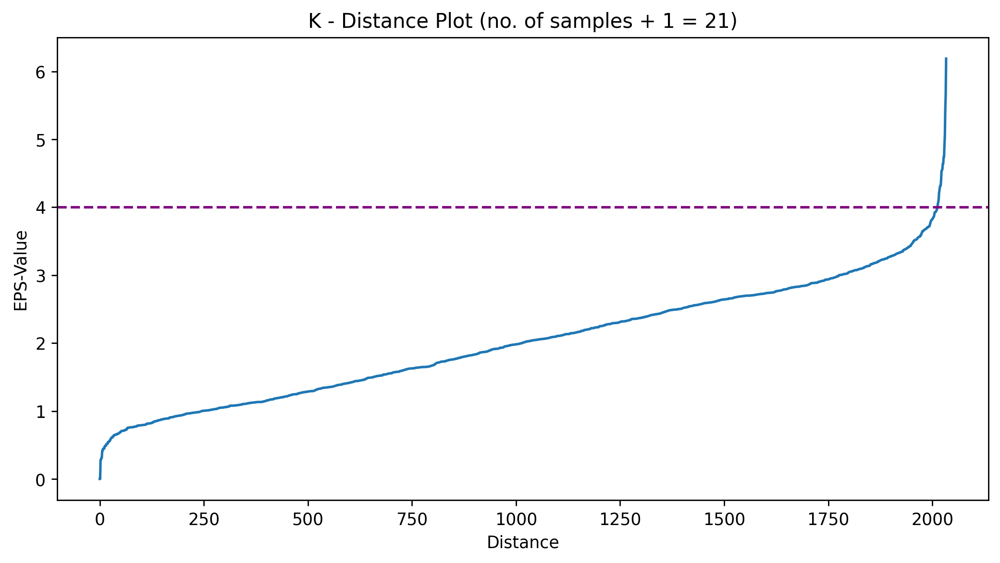

In [68]:
# plotting K- distance plot to know optimal no. of eps value
plt.plot(distance1)
plt.title('K - Distance Plot (no. of samples + 1 = 21)')
plt.axhline(4, linestyle = '--', color = 'purple')
plt.xlabel('Distance')
plt.ylabel('EPS-Value')

Text(0, 0.5, 'EPS-Value')

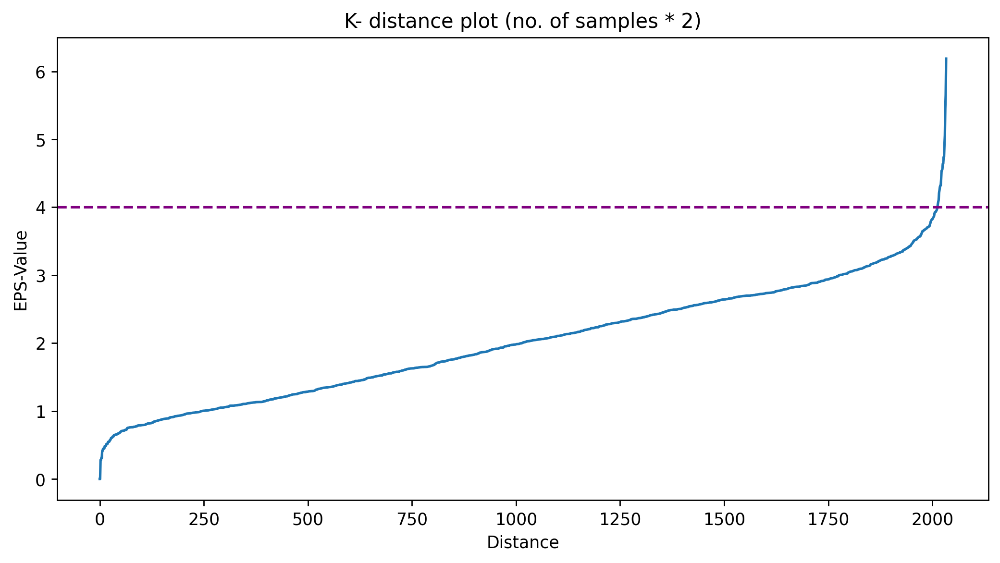

In [69]:
# Rule 2 -> No. of samples *2
neigh2 = NearestNeighbors(n_neighbors=40).fit(pcs) # (no. of samples * 2) i.e.(20*2)
d2, index2 = neigh2.kneighbors(pcs)
distance2 = np.sort(d2[:,1])
plt.plot(distance2)
plt.axhline(4, linestyle = '--', color = 'purple')
plt.title('K- distance plot (no. of samples * 2)')
plt.xlabel('Distance')
plt.ylabel('EPS-Value')

In [70]:
# I think 4 is the ideal eps value where we can see the change in slope of line

In [71]:
pcs.head()

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumStorePurchases,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,KM_Clusters
0,5.446908,1.596027,2.450277,0.187151,0.692765,-1.998000,-1.180487,-1.640856,0.026894,0.662359,...,1.675125,-0.019059,0.116210,0.056829,-0.093519,0.748449,0.136444,-0.414580,0.711710,0
1,-3.026638,-1.078554,-1.368121,-1.689769,-0.107140,0.112623,-0.525647,-0.713752,0.389224,-0.390967,...,0.331870,0.735838,-0.466735,-0.290718,-0.078136,0.413326,-0.353469,0.138078,0.319266,1
2,2.359628,-0.652188,-0.880698,0.232794,-0.368634,0.616306,-1.052719,0.753371,-1.131450,0.962276,...,-0.569202,-0.200257,0.328437,-0.053659,-1.339630,-0.175534,-0.051898,1.468856,-0.201896,0
3,-2.885269,-0.965010,0.881860,0.266688,-0.562896,1.459526,0.391816,-0.103090,-0.526549,0.193703,...,0.383381,0.276430,-0.301208,-0.736248,-0.333813,0.606982,0.016603,-0.149469,-0.012290,1
4,0.130790,0.326647,-0.646069,0.989476,0.098751,1.114756,1.888227,-1.331204,0.180033,0.980147,...,1.069280,-0.319012,-0.657144,0.758031,0.316216,-0.090599,0.902417,-0.263946,-0.259885,2


In [72]:
# Creating final DBSCAN model with optimal eps value
db2 = DBSCAN(eps = 4, min_samples=21) # (no. of samples * 2) i.e.(25+1)
db2_pred = db2.fit_predict(pcs)
pcs['db2_clusters'] = db2_pred
pcs['db2_clusters']

0       1
1       0
2       0
3       0
4       0
       ..
2029    0
2030    0
2031    0
2032    0
2033    0
Name: db2_clusters, Length: 2034, dtype: int64

<Axes: xlabel='Income', ylabel='Total_amt_spend'>

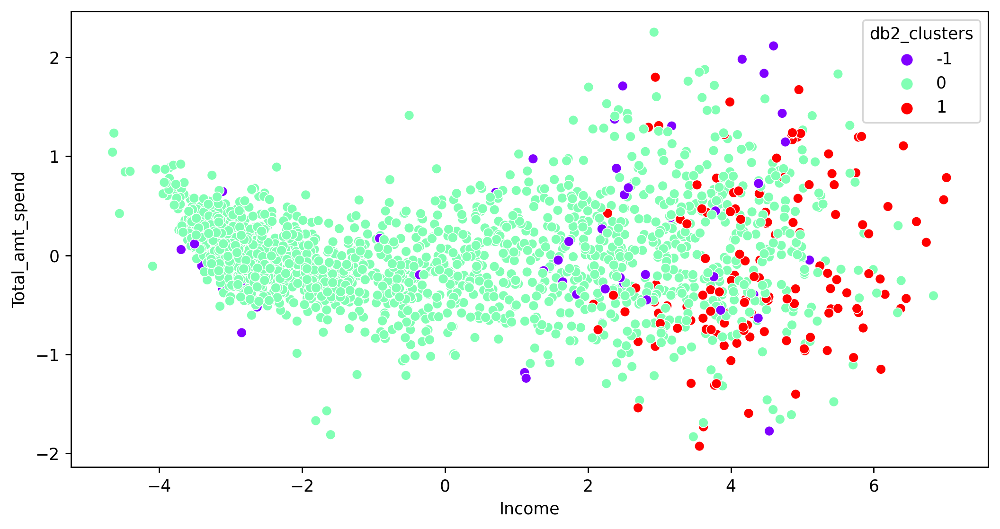

In [73]:
# Visualizing the clusters
sns.scatterplot(x = pcs['Income'], y = pcs['Total_amt_spend'], hue = pcs['db2_clusters'], palette = 'rainbow')

In [74]:
# Here we can see that most of the datapoints are under the 0th cluster.
# This can mislead model to predict the cluster for new unseen records.
# This could not be a good method to form clusters for this dataframe.

In [75]:
pe.scatter_3d(x = pcs['Age'], y = pcs['Total_amt_spend'], z = pcs['Income'], color = pcs['db2_clusters'])

<Axes: xlabel='Age', ylabel='Num_Childrns'>

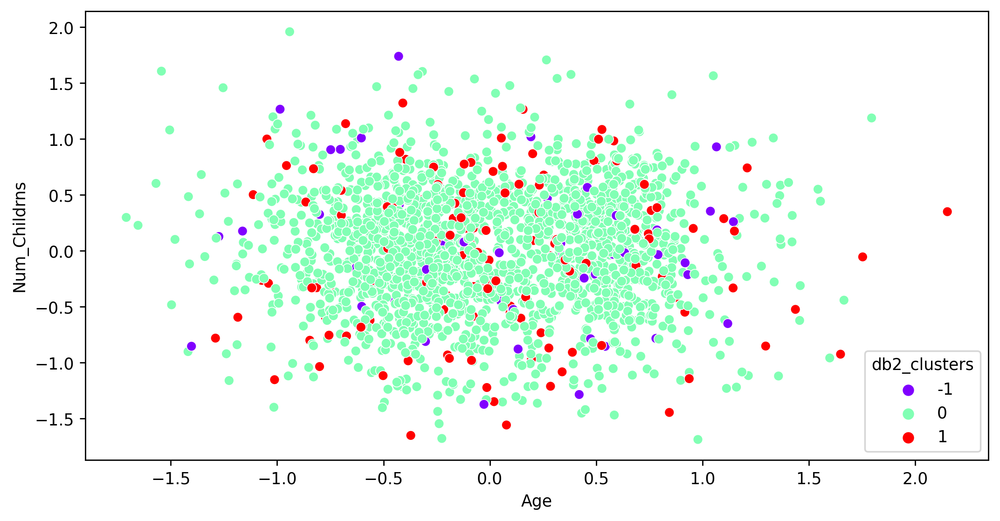

In [76]:
sns.scatterplot(x = pcs['Age'], y = pcs['Num_Childrns'], hue = pcs['db2_clusters'], palette = 'rainbow')

In [77]:
pe.scatter_3d(x = pcs['Age'], y = pcs['Num_Childrns'], z = pcs['Income'], color = pcs['db2_clusters'])

In [78]:
pcs.shape

(2034, 22)

In [79]:
pcs['db2_clusters'].unique()

array([ 1,  0, -1], dtype=int64)

In [80]:
pcs[pcs['db2_clusters'] == 0]

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,KM_Clusters,db2_clusters
1,-3.026638,-1.078554,-1.368121,-1.689769,-0.107140,0.112623,-0.525647,-0.713752,0.389224,-0.390967,...,0.735838,-0.466735,-0.290718,-0.078136,0.413326,-0.353469,0.138078,0.319266,1,0
2,2.359628,-0.652188,-0.880698,0.232794,-0.368634,0.616306,-1.052719,0.753371,-1.131450,0.962276,...,-0.200257,0.328437,-0.053659,-1.339630,-0.175534,-0.051898,1.468856,-0.201896,0,0
3,-2.885269,-0.965010,0.881860,0.266688,-0.562896,1.459526,0.391816,-0.103090,-0.526549,0.193703,...,0.276430,-0.301208,-0.736248,-0.333813,0.606982,0.016603,-0.149469,-0.012290,1,0
4,0.130790,0.326647,-0.646069,0.989476,0.098751,1.114756,1.888227,-1.331204,0.180033,0.980147,...,-0.319012,-0.657144,0.758031,0.316216,-0.090599,0.902417,-0.263946,-0.259885,2,0
5,1.172529,0.791295,-0.197307,-0.584084,-0.507034,0.910970,-0.116775,1.034105,-0.100855,1.099725,...,-0.328412,-0.093301,-0.253974,-0.457435,-0.267114,-0.256889,-1.163249,0.739037,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2029,-1.231173,0.158876,0.255968,-0.234978,-0.494844,1.122562,0.158046,0.160996,0.788015,-0.178312,...,1.035393,-0.322552,0.717344,-1.286317,1.182753,0.112770,-0.368417,-1.203745,1,0
2030,2.661378,0.753464,-0.120966,0.671445,-0.054614,0.097700,-0.550046,-0.946097,-1.012263,-0.398151,...,0.298256,0.740867,0.522827,0.826219,0.201430,-0.304515,-1.312188,-0.694249,2,0
2031,1.727531,-1.444823,-0.801508,1.019534,-0.083605,0.292934,2.149227,1.095938,-0.608143,0.218311,...,-0.785133,-1.660371,-1.548529,0.612776,-0.080890,-0.899769,0.815344,0.707024,0,0
2032,2.428044,-0.195643,-0.822893,-1.798598,-0.483799,1.393025,-0.589519,-0.268990,-0.791859,0.121393,...,0.420666,-0.056450,-0.651904,-0.442286,-0.008950,1.072686,-0.041014,0.274082,0,0


In [81]:
pcs[pcs['db2_clusters'] == 1]

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,KM_Clusters,db2_clusters
0,5.446908,1.596027,2.450277,0.187151,0.692765,-1.998000,-1.180487,-1.640856,0.026894,0.662359,...,-0.019059,0.116210,0.056829,-0.093519,0.748449,0.136444,-0.414580,0.711710,0,1
14,4.486447,1.318429,1.832350,-2.518817,0.059356,-1.344629,-0.291597,0.926094,-0.310992,1.025688,...,1.132594,0.255191,-0.504738,0.304916,-0.807861,0.064881,-0.215486,0.434940,0,1
37,2.991332,1.114850,1.756058,-2.158675,0.461334,-1.710307,-0.231386,-1.052858,-0.858342,0.906922,...,0.444655,1.606359,-0.127190,0.156107,-0.185366,1.263524,0.320379,1.308664,0,1
49,5.466061,-1.586718,2.737046,-0.319609,-0.030544,0.425084,0.760216,-2.383328,0.094737,-1.231047,...,-0.365395,-0.473138,0.017790,-0.313002,0.579364,0.459152,0.605579,0.411321,0,1
51,6.979100,0.035813,1.860305,-1.045232,0.522379,-1.740119,-0.485532,-0.628208,0.564454,-0.674257,...,0.353803,0.232790,-1.427853,0.496426,-0.533439,0.800077,-0.281514,0.560250,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1953,3.717020,1.054853,2.547835,-1.890877,-0.239375,-0.468006,-0.555476,-0.662604,-1.661933,0.028380,...,0.470950,-0.990312,0.862254,-0.836925,0.260632,-0.331748,-0.163473,-0.564716,0,1
1972,2.141961,-1.310623,3.191546,0.244380,0.244825,-0.850021,2.558099,-0.497092,0.534768,-0.469685,...,0.824707,-0.788895,0.696145,-0.605691,-0.570843,-0.682877,0.125066,-0.751085,0,1
1980,5.717833,-0.416254,3.166214,-0.830709,-0.676341,0.217023,-0.440759,-0.394275,0.503527,-0.889257,...,-0.216507,1.067121,-0.478875,1.209602,-0.676530,0.740401,-0.212439,-1.032188,0,1
1993,5.499794,-0.618558,2.876619,-0.117090,-0.313993,0.698217,0.933584,0.012078,0.923738,1.786011,...,1.079889,-0.078617,-0.497633,-0.135051,-0.650359,0.295198,0.639497,-0.536617,0,1


In [82]:
pcs[pcs['db2_clusters'] == -1]

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,KM_Clusters,db2_clusters
20,0.708678,0.596052,0.080447,0.506795,-0.334576,0.907401,0.930528,0.074041,2.208642,-1.499303,...,-1.070030,0.656785,0.776315,0.333536,2.331795,0.067230,-1.126894,0.633987,2,-1
62,4.465244,0.824386,1.393966,-1.007464,-0.999601,1.741728,1.388033,0.226469,-0.063903,0.244664,...,1.608027,0.784271,0.257864,-0.702824,-0.543442,0.906238,1.890293,1.835942,0,-1
72,-2.845820,-1.506670,2.601033,-1.133270,8.769171,3.621950,-1.140896,2.346317,-0.166570,-1.020738,...,-0.972824,0.920338,-0.196364,-0.649976,-0.892515,-0.146570,-0.682403,-0.781415,1,-1
135,-3.404508,-0.463644,2.414755,-0.078974,9.152993,3.214507,-0.249825,1.877404,-0.012356,-0.827686,...,0.287197,0.063739,-0.456083,-0.273379,0.147917,-0.185319,-0.198474,-0.106191,1,-1
152,2.200706,-0.385128,-1.434046,-1.198333,0.015769,0.601338,3.243741,-0.872868,3.189707,-1.511969,...,-0.877274,1.225456,1.985470,-0.425401,1.469386,0.413595,-1.152369,-0.682778,0,-1
179,-2.391630,-0.304734,0.256408,-2.641519,10.439357,0.700971,-0.707386,0.490171,-0.789050,-0.618367,...,-0.108060,0.090732,0.115242,0.036313,-0.538605,0.283308,-0.367485,-0.192538,1,-1
196,4.321080,4.403415,0.712265,-0.758622,-0.418830,-0.622907,-1.001334,0.133830,-0.523408,-0.837733,...,0.285989,-1.136355,-0.320252,0.132742,-0.144025,-0.878478,0.373589,-0.396786,2,-1
258,-2.629082,-0.133371,2.041546,-0.847850,8.416172,5.293607,-0.095684,1.493826,-0.156631,-0.697851,...,-0.043781,-0.234177,-0.127029,-0.225286,-0.941356,0.050616,-0.476174,-0.522567,1,-1
338,-3.225661,0.412163,1.823189,-0.347918,9.085994,3.749658,-0.286685,1.362156,0.649384,-0.940668,...,0.581808,-0.189630,-0.323242,-0.103767,0.128800,-0.160977,0.066484,0.065212,1,-1
341,1.113757,-0.634477,0.588204,-2.820798,9.705167,1.867218,-0.271596,2.231634,-0.607896,-0.411666,...,-0.444413,0.253763,0.572856,0.193157,-0.112821,1.018522,0.545639,-1.184095,2,-1


In [83]:
# Comparing sillhouette scores of all the clustering models created.

print(silhouette_score(pcs, db2_pred))      # Final DBSCAN MODEL
print(silhouette_score(pcs, final_Km_pred)) # FINAL K-MEANS MODEL
print(silhouette_score(pcs, km_pred))       # BASIC K-MEANS MODEL
print(silhouette_score(pcs, hc_predict))    # AGGLOMERATIVE CLUSTERING MODEL


0.24429894745908273
0.23469445541241965
0.13921683544026023
0.21299585606363663


In [84]:
# here we can see Final DBSCAN model has given highest accuracy as compared to other algorithms.
# But after visualizing the clusters we can see there is overlapping of clusters and they are not formed presizely and effectively. 
# As we saw before, clusters formed using optimized K-Means algorithm were giving excellent distributions of clusters.
# So selecting Optimized K-Means model as final clustering model for clustering.

# Dropping db2_clusters
pcs.drop(columns = 'db2_clusters', inplace = True)
pcs

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumStorePurchases,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,KM_Clusters
0,5.446908,1.596027,2.450277,0.187151,0.692765,-1.998000,-1.180487,-1.640856,0.026894,0.662359,...,1.675125,-0.019059,0.116210,0.056829,-0.093519,0.748449,0.136444,-0.414580,0.711710,0
1,-3.026638,-1.078554,-1.368121,-1.689769,-0.107140,0.112623,-0.525647,-0.713752,0.389224,-0.390967,...,0.331870,0.735838,-0.466735,-0.290718,-0.078136,0.413326,-0.353469,0.138078,0.319266,1
2,2.359628,-0.652188,-0.880698,0.232794,-0.368634,0.616306,-1.052719,0.753371,-1.131450,0.962276,...,-0.569202,-0.200257,0.328437,-0.053659,-1.339630,-0.175534,-0.051898,1.468856,-0.201896,0
3,-2.885269,-0.965010,0.881860,0.266688,-0.562896,1.459526,0.391816,-0.103090,-0.526549,0.193703,...,0.383381,0.276430,-0.301208,-0.736248,-0.333813,0.606982,0.016603,-0.149469,-0.012290,1
4,0.130790,0.326647,-0.646069,0.989476,0.098751,1.114756,1.888227,-1.331204,0.180033,0.980147,...,1.069280,-0.319012,-0.657144,0.758031,0.316216,-0.090599,0.902417,-0.263946,-0.259885,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2029,-1.231173,0.158876,0.255968,-0.234978,-0.494844,1.122562,0.158046,0.160996,0.788015,-0.178312,...,-0.298536,1.035393,-0.322552,0.717344,-1.286317,1.182753,0.112770,-0.368417,-1.203745,1
2030,2.661378,0.753464,-0.120966,0.671445,-0.054614,0.097700,-0.550046,-0.946097,-1.012263,-0.398151,...,-1.332593,0.298256,0.740867,0.522827,0.826219,0.201430,-0.304515,-1.312188,-0.694249,2
2031,1.727531,-1.444823,-0.801508,1.019534,-0.083605,0.292934,2.149227,1.095938,-0.608143,0.218311,...,0.044790,-0.785133,-1.660371,-1.548529,0.612776,-0.080890,-0.899769,0.815344,0.707024,0
2032,2.428044,-0.195643,-0.822893,-1.798598,-0.483799,1.393025,-0.589519,-0.268990,-0.791859,0.121393,...,0.134609,0.420666,-0.056450,-0.651904,-0.442286,-0.008950,1.072686,-0.041014,0.274082,0


In [85]:
pcs[pcs['KM_Clusters'] == 0]

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumStorePurchases,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,KM_Clusters
0,5.446908,1.596027,2.450277,0.187151,0.692765,-1.998000,-1.180487,-1.640856,0.026894,0.662359,...,1.675125,-0.019059,0.116210,0.056829,-0.093519,0.748449,0.136444,-0.414580,0.711710,0
2,2.359628,-0.652188,-0.880698,0.232794,-0.368634,0.616306,-1.052719,0.753371,-1.131450,0.962276,...,-0.569202,-0.200257,0.328437,-0.053659,-1.339630,-0.175534,-0.051898,1.468856,-0.201896,0
11,3.172521,-2.586059,-1.071090,0.848177,0.659619,-0.925909,-0.924557,-0.894487,0.583203,1.364634,...,0.445218,-0.419554,0.594672,-0.351139,-0.097068,-0.148302,-0.638809,0.371071,-0.408597,0
14,4.486447,1.318429,1.832350,-2.518817,0.059356,-1.344629,-0.291597,0.926094,-0.310992,1.025688,...,-0.491118,1.132594,0.255191,-0.504738,0.304916,-0.807861,0.064881,-0.215486,0.434940,0
17,4.441526,1.664184,-1.516956,-0.675617,0.525264,-1.181948,1.013069,-0.125829,-1.427267,-0.807592,...,-1.087136,-0.519812,-2.066491,1.056217,0.205552,0.271714,0.086381,-0.599248,-0.462907,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2006,3.209265,-0.748516,-0.489864,1.600091,0.467369,0.584964,0.593096,-1.247436,0.368558,1.155477,...,-0.819819,0.445811,-0.681690,0.526643,0.619836,0.373270,0.110850,-0.348004,0.620297,0
2013,3.723568,-2.382566,-0.445633,0.760092,-0.504320,1.365582,0.404142,0.269744,-0.140282,0.009255,...,0.085314,0.060821,-1.330599,-0.150438,-1.061823,0.306431,-0.245970,0.916595,-1.156709,0
2015,3.678717,-1.871368,0.545389,2.254326,-0.330900,0.163500,-0.013252,1.812159,1.507351,-0.147184,...,0.471307,0.566621,-0.392823,0.285168,-0.595981,-0.171413,0.092150,-0.213265,-0.176480,0
2031,1.727531,-1.444823,-0.801508,1.019534,-0.083605,0.292934,2.149227,1.095938,-0.608143,0.218311,...,0.044790,-0.785133,-1.660371,-1.548529,0.612776,-0.080890,-0.899769,0.815344,0.707024,0


In [86]:
pcs[pcs['KM_Clusters'] == 1]

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumStorePurchases,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,KM_Clusters
1,-3.026638,-1.078554,-1.368121,-1.689769,-0.107140,0.112623,-0.525647,-0.713752,0.389224,-0.390967,...,0.331870,0.735838,-0.466735,-0.290718,-0.078136,0.413326,-0.353469,0.138078,0.319266,1
3,-2.885269,-0.965010,0.881860,0.266688,-0.562896,1.459526,0.391816,-0.103090,-0.526549,0.193703,...,0.383381,0.276430,-0.301208,-0.736248,-0.333813,0.606982,0.016603,-0.149469,-0.012290,1
7,-2.404191,0.225914,1.027682,0.887672,-0.475477,0.641201,0.229281,0.742174,-0.536518,0.171234,...,-0.091256,0.078738,-0.487956,0.540736,0.457095,-0.074041,0.697050,-0.138081,-0.055307,1
8,-2.977728,0.325362,2.533788,-0.865660,-0.558508,-0.483997,-0.342649,0.180123,0.189310,0.410334,...,-0.007074,-0.037453,0.317170,-0.061276,-0.519066,-1.251423,-0.356104,0.411936,0.404120,1
9,-4.633321,-0.137970,-1.046309,-0.829363,0.314585,-1.468084,-0.520898,-0.555370,-0.863632,0.197993,...,0.615162,0.012497,-0.653940,-1.296169,0.581710,-0.544211,0.444230,-0.295447,1.233117,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025,-3.313202,-0.604278,-0.499566,-0.380895,-0.785543,1.315150,-0.870654,-0.294866,0.259941,-0.365512,...,0.027989,-0.333874,0.446929,0.037813,0.629870,0.295244,-0.171729,0.526504,0.515905,1
2026,-3.165988,0.459056,0.788102,1.805328,0.241776,-0.371395,0.846659,-0.405416,-0.643199,0.030674,...,0.872691,0.041796,-0.245541,-0.498519,-0.072032,0.601868,-0.027829,-0.083347,0.335625,1
2028,-2.898663,-1.922010,0.886455,1.741798,-0.041505,-0.803103,-0.438739,1.428810,0.176568,-0.386147,...,0.479373,0.388028,-0.182317,0.055392,-0.479760,0.038869,-0.682842,0.200168,-0.295272,1
2029,-1.231173,0.158876,0.255968,-0.234978,-0.494844,1.122562,0.158046,0.160996,0.788015,-0.178312,...,-0.298536,1.035393,-0.322552,0.717344,-1.286317,1.182753,0.112770,-0.368417,-1.203745,1


In [87]:
pcs[pcs['KM_Clusters'] == 2]

,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,...,NumStorePurchases,NumWebVisitsMonth,Complain,Response,Age,Cust_Since(yrs),Num_Childrns,AcceptedCmp,Total_amt_spend,KM_Clusters
4,0.130790,0.326647,-0.646069,0.989476,0.098751,1.114756,1.888227,-1.331204,0.180033,0.980147,...,1.069280,-0.319012,-0.657144,0.758031,0.316216,-0.090599,0.902417,-0.263946,-0.259885,2
5,1.172529,0.791295,-0.197307,-0.584084,-0.507034,0.910970,-0.116775,1.034105,-0.100855,1.099725,...,-0.811548,-0.328412,-0.093301,-0.253974,-0.457435,-0.267114,-0.256889,-1.163249,0.739037,2
6,1.276556,1.499594,-0.033274,1.144309,0.006808,0.298557,-1.228263,-0.181018,0.395650,1.452003,...,-0.307007,-0.536713,0.008257,0.508135,-0.726347,0.607556,-0.366420,-0.513263,-0.013840,2
16,-0.484804,-0.066243,-0.693235,-0.165117,0.180567,-1.311461,-2.910970,0.837166,-1.197819,0.755076,...,1.015643,0.396180,0.599502,-0.898461,-0.585843,0.200021,0.582564,1.481061,-0.363343,2
20,0.708678,0.596052,0.080447,0.506795,-0.334576,0.907401,0.930528,0.074041,2.208642,-1.499303,...,4.397360,-1.070030,0.656785,0.776315,0.333536,2.331795,0.067230,-1.126894,0.633987,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022,0.491291,0.732286,-0.397338,-1.399207,-0.786317,1.475636,1.320398,0.604400,-0.413111,-0.316852,...,0.352261,-0.428744,0.704501,0.302253,-0.712704,0.011711,0.397348,-0.529949,0.704785,2
2023,0.091814,3.248019,-1.986828,1.695358,-0.214319,0.916861,1.485612,-0.223437,-0.152139,-0.018933,...,0.370504,1.261720,-0.298565,1.015540,0.172464,0.180643,-0.357235,0.569019,-0.718004,2
2024,-0.088999,1.599139,-0.664891,-0.310772,-0.244519,0.607862,-0.091215,-0.492873,-0.395906,-1.171005,...,0.000838,-0.597052,0.146730,-0.429697,-0.405953,0.364473,-0.711644,-0.010678,-0.620971,2
2027,1.624713,1.800341,-1.004672,0.984417,-0.110460,-0.913740,1.002324,2.797839,-1.102213,0.664261,...,0.078149,-0.450384,0.211050,-0.334598,-0.400915,-0.941300,-0.741884,0.566974,0.681135,2


In [88]:
pcs.to_csv('Clustering_PCA.csv', index=False)